<a href="https://colab.research.google.com/github/snehamartin30/COVID/blob/main/project_6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import xgboost as xgb
from sklearn.ensemble import BaggingClassifier, VotingClassifier
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

In [3]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [4]:
covid_file_path = '/content/drive/MyDrive/FINAL PROJECT/covid_data.csv'
influenza_file_path = '/content/drive/My Drive/FINAL PROJECT/influenza_data.csv'
socioeconomic_file_path = '/content/drive/My Drive/FINAL PROJECT/socioeconomic_data.csv'
climate_change_file_path = '/content/drive/MyDrive/FINAL PROJECT/climate_change_data.csv'
healthcare_file_path = '/content/drive/MyDrive/FINAL PROJECT/healthcare_data.csv'

In [5]:
#Preprocess Each Dataset with Imputation

def impute_with_sampling(df, column):
    non_zero_non_na_values = df.loc[(df[column] != 0) & (~df[column].isna()), column]
    df.loc[df[column].isna() | (df[column] == 0), column] = np.random.choice(non_zero_non_na_values, size=df.loc[df[column].isna() | (df[column] == 0), column].shape[0], replace=True)
    return df


In [6]:
import pandas as pd

# Load the daily COVID data from the CSV file
file_path = '/content/drive/MyDrive/FINAL PROJECT/covid_data.csv'
covid_data = pd.read_csv(file_path)

# Convert the 'date' column to datetime format
covid_data['date'] = pd.to_datetime(covid_data['date'], errors='coerce')

# Sort the data by location and date
covid_data.sort_values(by=['location', 'date'], inplace=True)

# Resample the data on a quarterly basis for each location, using the end of the quarter
quarterly_data = covid_data.groupby('location').resample('Q', on='date').mean(numeric_only=True).reset_index()

# Compute the quarterly rolling average for relevant columns within each location
for column in ['new_cases', 'new_deaths']:
    quarterly_data[f'{column}_quarterly_avg'] = quarterly_data.groupby('location')[column].rolling(window=1).mean().reset_index(0, drop=True)

# Include the 'location' column in the quarterly data
quarterly_data = quarterly_data[['location', 'date'] + [col for col in quarterly_data.columns if col not in ['location', 'date']]]

# Save the quarterly data to a new CSV file
quarterly_data.to_csv('/content/drive/MyDrive/FINAL PROJECT/quarterly_covid_data.csv', index=False)
print("Quarterly data with rolling averages has been saved to 'quarterly_covid_data.csv'")

# Preprocess Quarterly COVID Data
# Load the CSV file
quarterly_covid_data = pd.read_csv('/content/drive/MyDrive/FINAL PROJECT/quarterly_covid_data.csv')

# Correct column to keep
quarterly_covid_columns_to_keep = ['location','date','total_cases', 'total_deaths','reproduction_rate','people_fully_vaccinated','gdp_per_capita','population','hosp_patients', 'population_density', 'life_expectancy', 'human_development_index']

# Drop unnecessary columns
quarterly_covid_data = quarterly_covid_data[quarterly_covid_columns_to_keep]

# Impute missing or zero values
for column in quarterly_covid_columns_to_keep[1:]:
    quarterly_covid_data = impute_with_sampling(quarterly_covid_data, column)

# Selecting relevant columns
quarterly_covid_data_selected = quarterly_covid_data[['location','date','total_cases','total_deaths','reproduction_rate','people_fully_vaccinated','gdp_per_capita','population', 'population_density', 'life_expectancy', 'human_development_index']]
print(quarterly_covid_data_selected.head())

Quarterly data with rolling averages has been saved to 'quarterly_covid_data.csv'
      location        date   total_cases  total_deaths  reproduction_rate  \
0  Afghanistan  2020-03-31     31.648649      2.333333           1.513333   
1  Afghanistan  2020-06-30  10984.142857    227.670330           1.312088   
2  Afghanistan  2020-09-30  37075.130435   1289.206522           0.871848   
3  Afghanistan  2020-12-31  44457.728261   1707.619565           1.123478   
4  Afghanistan  2021-03-31  55126.988889   2399.800000           0.917000   

   people_fully_vaccinated  gdp_per_capita  population  population_density  \
0             4.167682e+04        1803.987  39835428.0              54.422   
1             2.023360e+06        1803.987  39835428.0              54.422   
2             2.854884e+07        1803.987  39835428.0              54.422   
3             1.916520e+04        1803.987  39835428.0              54.422   
4             1.766667e+01        1803.987  39835428.0           

In [7]:
#Preprocess Influenza Data

file_path = '/content/drive/MyDrive/FINAL PROJECT/influenza_data.csv'
influenza_data = pd.read_csv(file_path)


# Columns to impute
influenza_columns = ['All strains - All types of surveillance', 'Reported deaths caused by severe acute respiratory infections', 'Cases of influenza-like illnesses', 'Share of positive tests - All types of surveillance']

# Impute each column
for column in influenza_columns:
    influenza_data = impute_with_sampling(influenza_data, column)

# Selecting relevant columns
influenza_data_selected = influenza_data[['Day', 'All strains - All types of surveillance', 'Reported deaths caused by severe acute respiratory infections', 'Cases of influenza-like illnesses', 'Share of positive tests - All types of surveillance']]
print(influenza_data_selected.head())

# Convert the 'Day' column to datetime format
influenza_data['Day'] = pd.to_datetime(influenza_data['Day'], errors='coerce')

# Check the data types to confirm the conversion
print(influenza_data.dtypes)

# Define the start and end dates for the filter
start_date = '2020-01-01'
end_date = '2022-12-31'

# Filter the data based on the 'Day' column
influenza_data_filtered = influenza_data[(influenza_data['Day'] >= start_date) & (influenza_data['Day'] <= end_date)]

# Select relevant columns if needed
influenza_data_filtered = influenza_data_filtered[['Country','Day', 'All strains - All types of surveillance', 'Reported deaths caused by severe acute respiratory infections', 'Cases of influenza-like illnesses', 'Share of positive tests - All types of surveillance']]

# Resample the data on a quarterly basis for each country, using the end of the quarter
quarterly_influenza_data = influenza_data_filtered.groupby('Country').resample('Q', on='Day').mean().reset_index()

# Include the 'Country' column in the quarterly data
quarterly_influenza_data = quarterly_influenza_data[['Country', 'Day'] + [col for col in quarterly_influenza_data.columns if col not in ['Country', 'Day']]]

# Save the quarterly data to a new CSV file
filtered_file_path = '/content/drive/MyDrive/FINAL PROJECT/quarterly_influenza_data.csv'
quarterly_influenza_data.to_csv(filtered_file_path, index=False)

# Print the first few rows and the shape of the quarterly data
print(quarterly_influenza_data.head())
print(f"Quarterly data shape: {quarterly_influenza_data.shape}")

          Day  All strains - All types of surveillance  \
0  2009-09-28                                      4.0   
1  2009-10-05                                    855.0   
2  2009-10-12                                      1.0   
3  2009-10-19                                     98.0   
4  2009-10-26                                     64.0   

   Reported deaths caused by severe acute respiratory infections  \
0                                              134.0               
1                                               63.0               
2                                               30.0               
3                                                7.0               
4                                                5.0               

   Cases of influenza-like illnesses  \
0                               38.0   
1                               66.0   
2                            11090.0   
3                               36.0   
4                               79.0   

 

In [8]:
#Preprocess Socioeconomic Data

file_path = '/content/drive/MyDrive/FINAL PROJECT/socioeconomic_data.csv'
socioeconomic_data = pd.read_csv(file_path)

# Columns to impute
socioeconomic_columns = ['Latitude','Country']

# Impute each column
for column in socioeconomic_columns:
    socioeconomic_data = impute_with_sampling(socioeconomic_data, column)

# Selecting relevant columns
socioeconomic_data_selected = socioeconomic_data[['Latitude','Country']]
print(socioeconomic_data_selected.head())


    Latitude      Country
0  33.939110  Afghanistan
1  41.153332      Albania
2  28.033886      Algeria
3  42.506285      Andorra
4 -11.202692       Angola


In [9]:
# Check for missing values
missing_values = socioeconomic_data_selected.isnull().sum()
print(missing_values[missing_values > 0])

Series([], dtype: int64)


In [10]:
#Preprocess climate data
import pandas as pd
from sklearn.impute import SimpleImputer

# Load the climate change data
climate_file_path = '/content/drive/MyDrive/FINAL PROJECT/climate_change_data.csv'
climate_data = pd.read_csv(climate_file_path)


# Convert the 'Date' column to datetime format
climate_data['Date'] = pd.to_datetime(climate_data['Date'], errors='coerce')

# Filter the data to include only records from 2020 to 2022
start_date = '2020-01-01'
end_date = '2022-12-31'
climate_data = climate_data[(climate_data['Date'] >= start_date) & (climate_data['Date'] <= end_date)]



# Sort the data by Country and Date
climate_data.sort_values(by=['Country', 'Date'], inplace=True)

# Identify the numeric columns and exclude 'Sea Level Rise'
numeric_columns = ['Temperature', 'CO2 Emissions', 'Precipitation', 'Humidity', 'Wind Speed']

# Group by 'Country' and resample the numeric data on a quarterly basis
quarterly_numeric_data = climate_data.groupby('Country').resample('Q', on='Date')[numeric_columns].mean().reset_index()

# Impute NaN values using mean imputation
imputer = SimpleImputer(strategy='mean')
quarterly_numeric_data[numeric_columns] = imputer.fit_transform(quarterly_numeric_data[numeric_columns])

# Ensure the 'Country' column is included in the quarterly data
quarterly_climate_data = quarterly_numeric_data[['Country', 'Date'] + numeric_columns]

# Save the quarterly data to a new CSV file
quarterly_file_path = '/content/drive/MyDrive/FINAL PROJECT/quarterly_climate_data.csv'  # Adjust this path as needed
quarterly_climate_data.to_csv(quarterly_file_path, index=False)

# Print the first few rows and the shape of the quarterly data
print(quarterly_climate_data.head())
print(f"Quarterly data shape: {quarterly_climate_data.shape}")


       Country       Date  Temperature  CO2 Emissions  Precipitation  \
0  Afghanistan 2020-03-31     6.675645     377.580973      97.282837   
1  Afghanistan 2020-06-30    14.958386     398.346017      48.685676   
2  Afghanistan 2020-09-30    14.958386     398.346017      48.685676   
3  Afghanistan 2020-12-31    14.958386     398.346017      48.685676   
4  Afghanistan 2021-03-31    14.958386     398.346017      48.685676   

    Humidity  Wind Speed  
0  35.274872   39.198311  
1  49.712111   25.180540  
2  49.712111   25.180540  
3  49.712111   25.180540  
4  49.712111   25.180540  
Quarterly data shape: (2122, 7)


In [11]:
# Load the healthcare dataset
healthcare_data = pd.read_csv('/content/drive/MyDrive/FINAL PROJECT/healthcare_data.csv')

# Drop unnecessary columns
columns_to_keep = ['Country Name', 'Year', 'Value']
healthcare_data = healthcare_data[columns_to_keep]

# Drop rows with NaN in 'Year' column, since we cannot process them
healthcare_data = healthcare_data.dropna(subset=['Year'])

# Ensure 'Year' column is an integer
healthcare_data['Year'] = healthcare_data['Year'].astype(int)

# Create a 'date' column for the end of each year
healthcare_data['date'] = pd.to_datetime(healthcare_data['Year'].astype(str) + '-12-31')

# Repeat yearly values for each quarter
quarters = ['03-31', '06-30', '09-30', '12-31']
quarterly_rows = []

for idx, row in healthcare_data.iterrows():
    for quarter in quarters:
        new_row = row.copy()
        new_row['date'] = pd.to_datetime(f"{row['Year']}-{quarter}")
        quarterly_rows.append(new_row)

healthcare_quarterly_data = pd.DataFrame(quarterly_rows)

# Rename columns to match other datasets
healthcare_quarterly_data.rename(columns={'Country Name': 'location'}, inplace=True)
# Fill NaN values with imputation
imputer = SimpleImputer(strategy='mean')
healthcare_quarterly_data['Value'] = imputer.fit_transform(healthcare_quarterly_data[['Value']])

# Save the quarterly data to a new CSV file
healthcare_quarterly_data.to_csv('/content/drive/MyDrive/FINAL PROJECT/healthcare_quarterly_data.csv', index=False)
print("Quarterly healthcare data has been saved to 'healthcare_quarterly_data.csv'")
# Print the first few rows and the shape of the quarterly data
print(healthcare_quarterly_data.head())
print(f"Quarterly data shape: {healthcare_quarterly_data.shape}")

Quarterly healthcare data has been saved to 'healthcare_quarterly_data.csv'
                      location  Year        Value       date
0                        Aruba  2010  1426.319488 2010-03-31
0                        Aruba  2010  1426.319488 2010-06-30
0                        Aruba  2010  1426.319488 2010-09-30
0                        Aruba  2010  1426.319488 2010-12-31
1  Africa Eastern and Southern  2010   198.329791 2010-03-31
Quarterly data shape: (14896, 4)


In [12]:
# Apply the mapping

#Define the location mapping
location_mapping = {
    'Original Country Name 1': 'Standardized Country Name',
    'Original Country Name 2': 'Standardized Country Name',

}

# Rename columns to 'location' for consistency
quarterly_covid_data.rename(columns={'location': 'location'}, inplace=True)
quarterly_influenza_data.rename(columns={'Country': 'location'}, inplace=True)
quarterly_climate_data.rename(columns={'Country': 'location'}, inplace=True)
healthcare_quarterly_data.rename(columns={'Country Name': 'location'}, inplace=True)

# Apply the location mapping to each dataset
quarterly_covid_data['location'] = quarterly_covid_data['location'].replace(location_mapping)
quarterly_influenza_data['location'] = quarterly_influenza_data['location'].replace(location_mapping)
quarterly_climate_data['location'] = quarterly_climate_data['location'].replace(location_mapping)
healthcare_quarterly_data['location'] = healthcare_quarterly_data['location'].replace(location_mapping)

# Print updated datasets to verify changes
print("Updated quarterly_covid_data:")
print(quarterly_covid_data.head())

print("\nUpdated quarterly_influenza_data:")
print(quarterly_influenza_data.head())

print("\nUpdated quarterly_climate_data:")
print(quarterly_climate_data.head())

print("\nUpdated healthcare_quarterly_data:")
print(healthcare_quarterly_data.head())

Updated quarterly_covid_data:
      location        date   total_cases  total_deaths  reproduction_rate  \
0  Afghanistan  2020-03-31     31.648649      2.333333           1.513333   
1  Afghanistan  2020-06-30  10984.142857    227.670330           1.312088   
2  Afghanistan  2020-09-30  37075.130435   1289.206522           0.871848   
3  Afghanistan  2020-12-31  44457.728261   1707.619565           1.123478   
4  Afghanistan  2021-03-31  55126.988889   2399.800000           0.917000   

   people_fully_vaccinated  gdp_per_capita  population  hosp_patients  \
0             4.167682e+04        1803.987  39835428.0       5.521739   
1             2.023360e+06        1803.987  39835428.0   13706.233333   
2             2.854884e+07        1803.987  39835428.0     367.847826   
3             1.916520e+04        1803.987  39835428.0     491.434783   
4             1.766667e+01        1803.987  39835428.0     652.741379   

   population_density  life_expectancy  human_development_index  
0 

In [13]:
# Print column names to verify
print("quarterly_covid_data columns:", quarterly_covid_data.columns)
print("quarterly_influenza_data columns:", quarterly_influenza_data.columns)
print("quarterly_climate_data columns:", quarterly_climate_data.columns)
print("healthcare_quarterly_data columns:", healthcare_quarterly_data.columns)

quarterly_covid_data columns: Index(['location', 'date', 'total_cases', 'total_deaths', 'reproduction_rate',
       'people_fully_vaccinated', 'gdp_per_capita', 'population',
       'hosp_patients', 'population_density', 'life_expectancy',
       'human_development_index'],
      dtype='object')
quarterly_influenza_data columns: Index(['location', 'Day', 'All strains - All types of surveillance',
       'Reported deaths caused by severe acute respiratory infections',
       'Cases of influenza-like illnesses',
       'Share of positive tests - All types of surveillance'],
      dtype='object')
quarterly_climate_data columns: Index(['location', 'Date', 'Temperature', 'CO2 Emissions', 'Precipitation',
       'Humidity', 'Wind Speed'],
      dtype='object')
healthcare_quarterly_data columns: Index(['location', 'Year', 'Value', 'date'], dtype='object')


In [14]:
# Check for duplicate dates within each dataset
# Rename 'Day' column to 'date' in the quarterly_influenza_data dataset
quarterly_influenza_data.rename(columns={'Day': 'date'}, inplace=True)

# Rename 'Date' column to 'date' in the quarterly_climate_data dataset
quarterly_climate_data.rename(columns={'Date': 'date'}, inplace=True)

# Check for duplicate dates within each dataset
print("Quarterly COVID Data:")
print(quarterly_covid_data.groupby(['location', 'date']).size().reset_index(name='counts'))

print("Quarterly Influenza Data:")
print(quarterly_influenza_data.groupby(['location', 'date']).size().reset_index(name='counts'))

print("Quarterly Climate Data:")
print(quarterly_climate_data.groupby(['location', 'date']).size().reset_index(name='counts'))

print("Healthcare Quarterly Data:")
print(healthcare_quarterly_data.groupby(['location', 'date']).size().reset_index(name='counts'))



Quarterly COVID Data:
         location        date  counts
0     Afghanistan  2020-03-31       1
1     Afghanistan  2020-06-30       1
2     Afghanistan  2020-09-30       1
3     Afghanistan  2020-12-31       1
4     Afghanistan  2021-03-31       1
...           ...         ...     ...
2032     Zimbabwe  2021-03-31       1
2033     Zimbabwe  2021-06-30       1
2034     Zimbabwe  2021-09-30       1
2035     Zimbabwe  2021-12-31       1
2036     Zimbabwe  2022-03-31       1

[2037 rows x 3 columns]
Quarterly Influenza Data:
         location       date  counts
0     Afghanistan 2020-03-31       1
1     Afghanistan 2020-06-30       1
2     Afghanistan 2020-09-30       1
3     Afghanistan 2020-12-31       1
4     Afghanistan 2021-03-31       1
...           ...        ...     ...
2349     Zimbabwe 2021-12-31       1
2350     Zimbabwe 2022-03-31       1
2351     Zimbabwe 2022-06-30       1
2352     Zimbabwe 2022-09-30       1
2353     Zimbabwe 2022-12-31       1

[2354 rows x 3 columns]
Qu

In [15]:


# Load the healthcare data
healthcare_quarterly_data = pd.read_csv('/content/drive/MyDrive/FINAL PROJECT/healthcare_quarterly_data.csv')

# Rename 'Value' column to 'health_expenditure'
healthcare_quarterly_data.rename(columns={'Value': 'health_expenditure'}, inplace=True)

# Generate quarterly dates for each year
def expand_to_quarterly(df):
    quarters = ['03-31', '06-30', '09-30', '12-31']
    expanded_data = []
    for _, row in df.iterrows():
        for quarter in quarters:
            date = f"{int(row['Year'])}-{quarter}"
            expanded_data.append({
                'location': row['location'],
                'health_expenditure': row['health_expenditure'],
                'date': date
            })
    return pd.DataFrame(expanded_data)



# Apply the expansion function
healthcare_quarterly_data = expand_to_quarterly(healthcare_quarterly_data)

# Convert 'date' to datetime format
healthcare_quarterly_data['date'] = pd.to_datetime(healthcare_quarterly_data['date'], format='%Y-%m-%d')


# Filter data to include only the years 2020 to 2022
healthcare_quarterly_data = healthcare_quarterly_data[
    (healthcare_quarterly_data['date'].dt.year >= 2020) & (healthcare_quarterly_data['date'].dt.year <= 2022)
]

# Print to verify
print("Updated healthcare_quarterly_data:")
print(healthcare_quarterly_data.head())



Updated healthcare_quarterly_data:
      location  health_expenditure       date
42560    Aruba         1426.319488 2020-03-31
42561    Aruba         1426.319488 2020-06-30
42562    Aruba         1426.319488 2020-09-30
42563    Aruba         1426.319488 2020-12-31
42564    Aruba         1426.319488 2020-03-31


In [16]:
# Remove duplicates before merging
quarterly_covid_data = quarterly_covid_data.drop_duplicates()
quarterly_influenza_data = quarterly_influenza_data.drop_duplicates()
quarterly_climate_data = quarterly_climate_data.drop_duplicates()
healthcare_quarterly_data = healthcare_quarterly_data.drop_duplicates()

# Convert 'date' columns to datetime format in all datasets
quarterly_covid_data['date'] = pd.to_datetime(quarterly_covid_data['date'])
quarterly_influenza_data['date'] = pd.to_datetime(quarterly_influenza_data['date'])
quarterly_climate_data['date'] = pd.to_datetime(quarterly_climate_data['date'])
healthcare_quarterly_data['date'] = pd.to_datetime(healthcare_quarterly_data['date'])

# Merge datasets on 'location' and 'date'
merged_data = quarterly_covid_data.merge(
    quarterly_influenza_data,
    on=['location', 'date'],
    how='inner'
).merge(
    quarterly_climate_data,
    on=['location', 'date'],
    how='inner'
).merge(
    healthcare_quarterly_data,
    on=['location', 'date'],
    how='inner'
)

# Print the merged data to verify
print(merged_data.head())



      location       date   total_cases  total_deaths  reproduction_rate  \
0  Afghanistan 2020-03-31     31.648649      2.333333           1.513333   
1  Afghanistan 2020-06-30  10984.142857    227.670330           1.312088   
2  Afghanistan 2020-09-30  37075.130435   1289.206522           0.871848   
3  Afghanistan 2020-12-31  44457.728261   1707.619565           1.123478   
4  Afghanistan 2021-03-31  55126.988889   2399.800000           0.917000   

   people_fully_vaccinated  gdp_per_capita  population  hosp_patients  \
0             4.167682e+04        1803.987  39835428.0       5.521739   
1             2.023360e+06        1803.987  39835428.0   13706.233333   
2             2.854884e+07        1803.987  39835428.0     367.847826   
3             1.916520e+04        1803.987  39835428.0     491.434783   
4             1.766667e+01        1803.987  39835428.0     652.741379   

   population_density  ...  All strains - All types of surveillance  \
0              54.422  ...       

<ipython-input-16-31eb94ba1695>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  healthcare_quarterly_data['date'] = pd.to_datetime(healthcare_quarterly_data['date'])


In [17]:
# Load the datasets
merged_data = pd.read_csv('/content/drive/MyDrive/FINAL PROJECT/finalmerged_data.csv')
socioeconomic_data = pd.read_csv('/content/drive/MyDrive/FINAL PROJECT/socioeconomic_data.csv')


# Rename 'country' to 'location' in socioeconomic_data
socioeconomic_data.rename(columns={'Country': 'location'}, inplace=True)

# Merge socioeconomic_data with merged_data on 'location'
project_merged_data = pd.merge(
    merged_data,
    socioeconomic_data[['location', 'Latitude']],
    on='location',
    how='left'  # Use 'left' join to keep all rows from merged_data
)

# Save the final DataFrame to a CSV file
project_merged_data.to_csv('/content/drive/MyDrive/FINAL PROJECT/Project_merged_data.csv', index=False)

# Print the first few rows to verify
print("Project Merged Data:")
print(project_merged_data.head())

Project Merged Data:
      location        date   total_cases  total_deaths   new_cases  \
0  Afghanistan  2020-03-31     31.648649      2.333333    4.666667   
1  Afghanistan  2020-03-31     31.648649      2.333333    4.666667   
2  Afghanistan  2020-03-31     31.648649      2.333333    4.666667   
3  Afghanistan  2020-03-31     31.648649      2.333333    4.666667   
4  Afghanistan  2020-06-30  10984.142857    227.670330  343.725275   

   new_deaths  reproduction_rate  gdp_per_capita  population  hosp_patients  \
0    0.444444           1.513333        1803.987  39835428.0      12.939394   
1    0.444444           1.513333        1803.987  39835428.0      12.939394   
2    0.444444           1.513333        1803.987  39835428.0      12.939394   
3    0.444444           1.513333        1803.987  39835428.0      12.939394   
4    8.076923           1.312088        1803.987  39835428.0    1847.351648   

   ...  Reported deaths caused by severe acute respiratory infections  \
0  ...    

In [18]:
#Filtering data by countries
# Print unique values in the 'location' column
#print(project_merged_data['location'].unique())

# Strip leading and trailing spaces from 'location' column
project_merged_data['location'] = project_merged_data['location'].str.strip()

developed_nations = ['Bahrain', 'Finland','France', 'Germany','Japan', 'Ireland', 'Italy', 'Netherlands','Singapore','Switzerland', 'United Kingdom', 'United States']
developing_nations = ['China','India','Peru','Philippines','Brazil','Bangladesh','Angola','Haiti','Indonesia','Afghanistan',]
underdeveloped_nations = ['Nigeria', 'Chad', 'Ethiopia', 'Mali', 'Madagascar','Niger','Mozambique','kenya', 'Tanzania','Somalia','Uganda','Central African Republic']
island_nations = ['Marshall Islands', 'St. Vincent and the Grenadines', 'Jamaica', 'Tonga', 'Kiribati', 'Dominica', 'Samoa', 'Fiji', 'Vanuatu', 'Solomon Islands', 'Maldives', 'Malta', 'Sri Lanka']


# Strip leading and trailing spaces from 'location' column
project_merged_data['location'] = project_merged_data['location'].str.strip()

# Filter data for each category
developed_countries_data = project_merged_data[project_merged_data['location'].isin(developed_nations)]
developing_countries_data = project_merged_data[project_merged_data['location'].isin(developing_nations)]
underdeveloped_countries_data = project_merged_data[project_merged_data['location'].isin(underdeveloped_nations)]
island_countries_data = project_merged_data[project_merged_data['location'].isin(island_nations)]

# Print the number of entries in each category to verify
print("Developed Countries Data:")
print(developed_countries_data)

print("Developing Countries Data:")
print(developing_countries_data)

print("Underdeveloped Countries Data:")
print(underdeveloped_countries_data)

print("Island Countries Data:")
print(island_countries_data)




Developed Countries Data:
            location        date   total_cases   total_deaths     new_cases  \
368          Bahrain  2020-06-30  9.170747e+03      21.758242    287.813187   
369          Bahrain  2020-06-30  9.170747e+03      21.758242    287.813187   
370          Bahrain  2020-06-30  9.170747e+03      21.758242    287.813187   
371          Bahrain  2020-06-30  9.170747e+03      21.758242    287.813187   
372          Bahrain  2020-09-30  4.759271e+04     168.250000    479.413043   
...              ...         ...           ...            ...           ...   
3991  United Kingdom  2021-09-30  6.324803e+06  131571.891304  32754.380435   
3992  United Kingdom  2021-12-31  9.798229e+06  142927.336957  55935.326087   
3993  United Kingdom  2021-12-31  9.798229e+06  142927.336957  55935.326087   
3994  United Kingdom  2021-12-31  9.798229e+06  142927.336957  55935.326087   
3995  United Kingdom  2021-12-31  9.798229e+06  142927.336957  55935.326087   

      new_deaths  reprodu


--- EDA for Developed Countries ---
Dimensions of the dataset: (264, 24)

First few rows of the dataset:
    location        date   total_cases  total_deaths   new_cases  new_deaths  \
368  Bahrain  2020-06-30   9170.747253     21.758242  287.813187    0.912088   
369  Bahrain  2020-06-30   9170.747253     21.758242  287.813187    0.912088   
370  Bahrain  2020-06-30   9170.747253     21.758242  287.813187    0.912088   
371  Bahrain  2020-06-30   9170.747253     21.758242  287.813187    0.912088   
372  Bahrain  2020-09-30  47592.706522    168.250000  479.413043    1.782609   

     reproduction_rate  gdp_per_capita  population  hosp_patients  ...  \
368           1.268791       43290.705   1748295.0     529.466667  ...   
369           1.268791       43290.705   1748295.0     529.466667  ...   
370           1.268791       43290.705   1748295.0     529.466667  ...   
371           1.268791       43290.705   1748295.0     529.466667  ...   
372           1.008913       43290.705   17

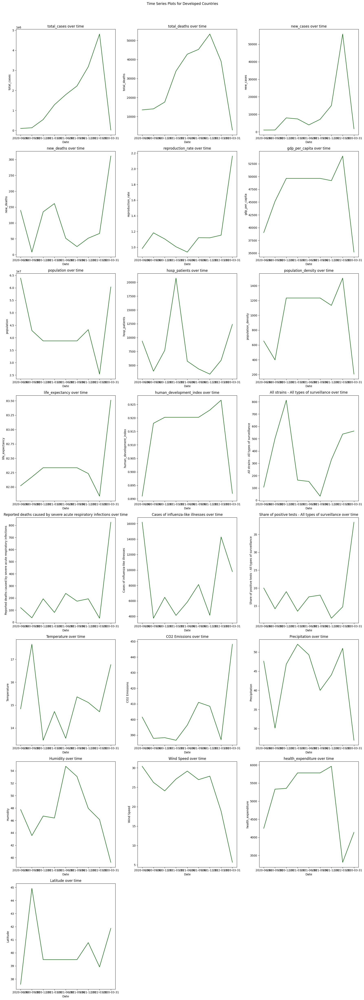

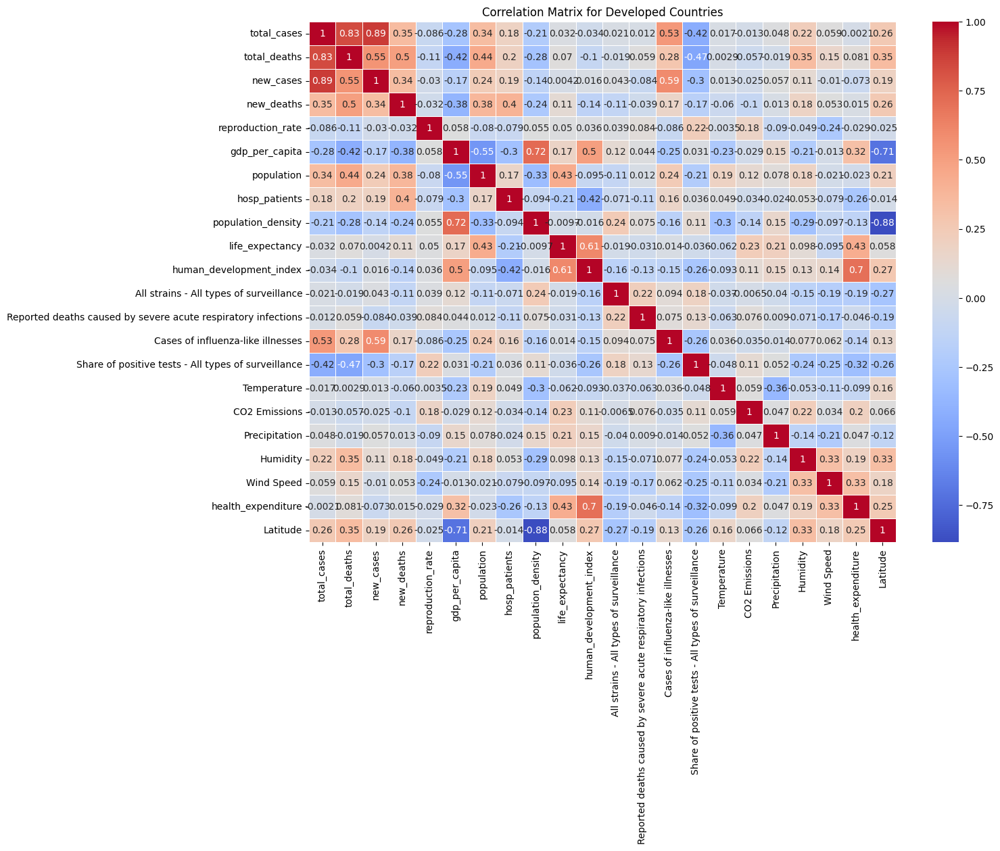


--- EDA for Developing Countries ---
Dimensions of the dataset: (296, 24)

First few rows of the dataset:
      location        date   total_cases  total_deaths   new_cases  \
0  Afghanistan  2020-03-31     31.648649      2.333333    4.666667   
1  Afghanistan  2020-03-31     31.648649      2.333333    4.666667   
2  Afghanistan  2020-03-31     31.648649      2.333333    4.666667   
3  Afghanistan  2020-03-31     31.648649      2.333333    4.666667   
4  Afghanistan  2020-06-30  10984.142857    227.670330  343.725275   

   new_deaths  reproduction_rate  gdp_per_capita  population  hosp_patients  \
0    0.444444           1.513333        1803.987  39835428.0      12.939394   
1    0.444444           1.513333        1803.987  39835428.0      12.939394   
2    0.444444           1.513333        1803.987  39835428.0      12.939394   
3    0.444444           1.513333        1803.987  39835428.0      12.939394   
4    8.076923           1.312088        1803.987  39835428.0    1847.351648  

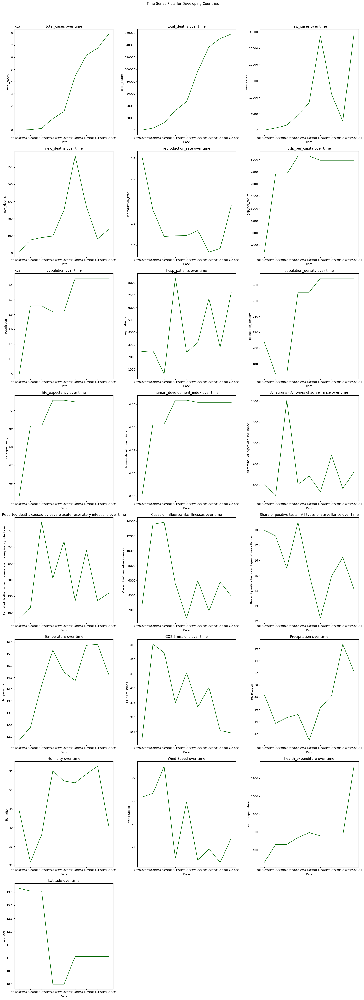

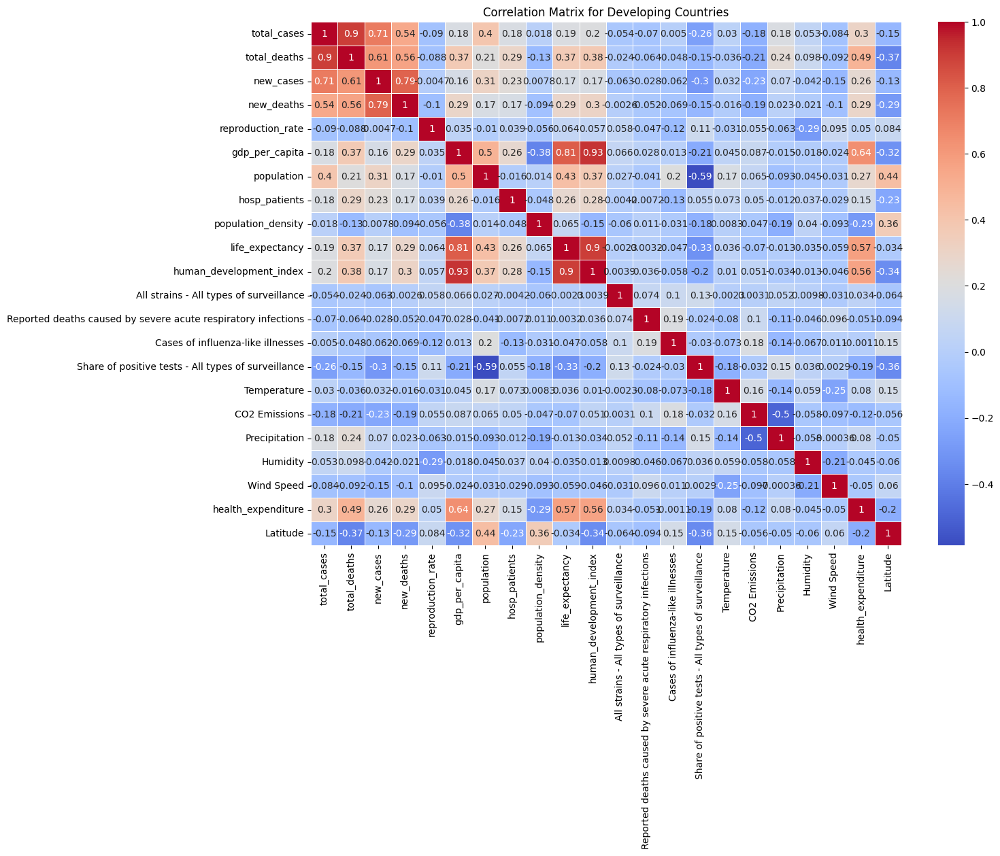


--- EDA for Underdeveloped Countries ---
Dimensions of the dataset: (304, 24)

First few rows of the dataset:
                     location        date  total_cases  total_deaths  \
884  Central African Republic  2020-03-31     2.411765     10.093750   
885  Central African Republic  2020-03-31     2.411765     10.093750   
886  Central African Republic  2020-03-31     2.411765     10.093750   
887  Central African Republic  2020-03-31     2.411765     10.093750   
888  Central African Republic  2020-06-30   907.120879     14.589744   

     new_cases  new_deaths  reproduction_rate  gdp_per_capita  population  \
884   0.176471    0.255556           0.573279          661.24   4919987.0   
885   0.176471    0.255556           0.573279          661.24   4919987.0   
886   0.176471    0.255556           0.573279          661.24   4919987.0   
887   0.176471    0.255556           0.573279          661.24   4919987.0   
888  41.120879    1.205128           1.045849          661.24   4919987

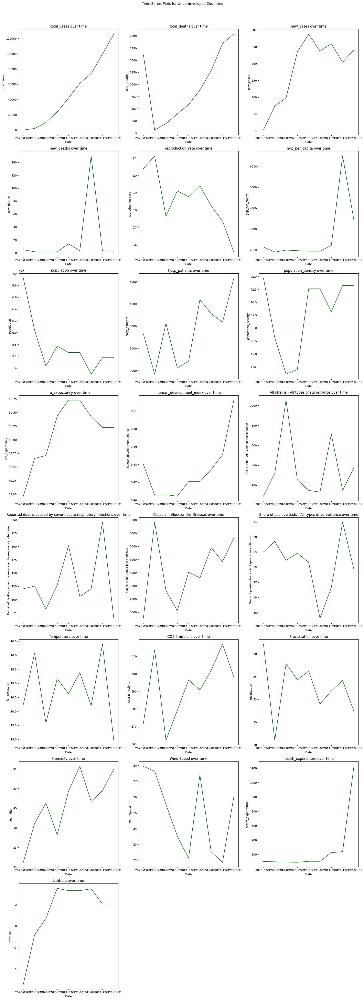

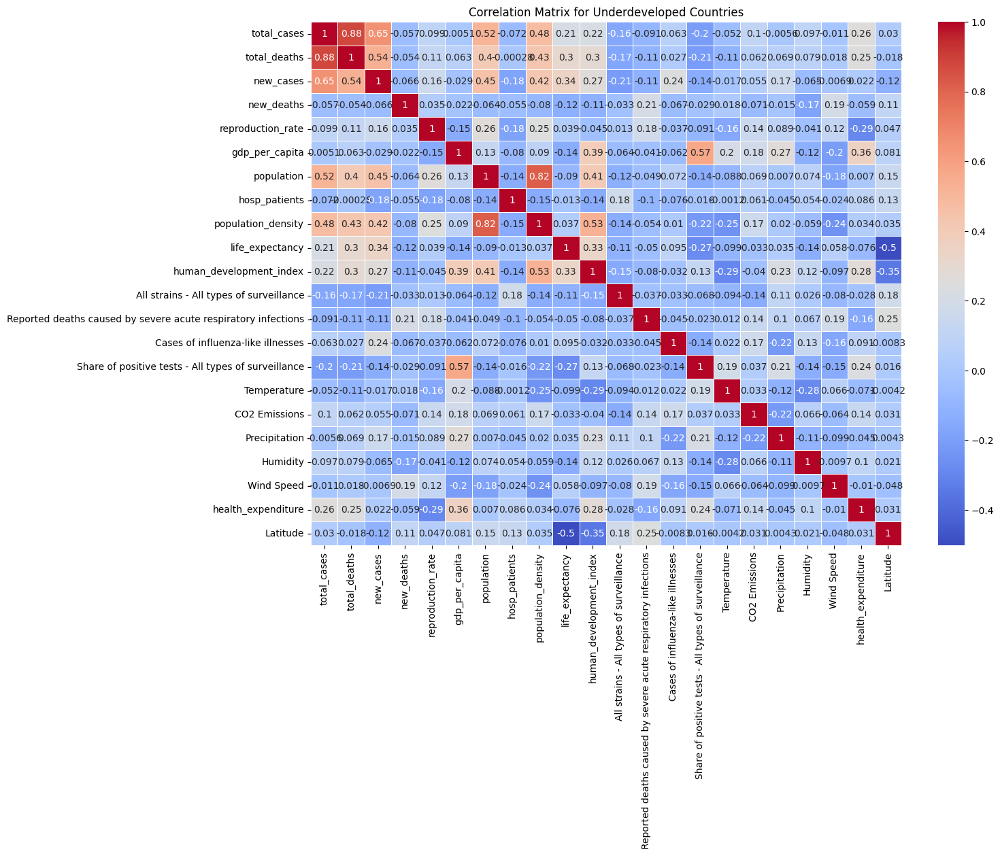


--- EDA for Island Countries ---
Dimensions of the dataset: (320, 24)

First few rows of the dataset:
      location        date  total_cases   total_deaths  new_cases  new_deaths  \
1176  Dominica  2020-03-31     7.900000  220484.956044   1.200000    0.428571   
1177  Dominica  2020-03-31     7.900000  220484.956044   1.200000    0.428571   
1178  Dominica  2020-03-31     7.900000  220484.956044   1.200000    0.428571   
1179  Dominica  2020-03-31     7.900000  220484.956044   1.200000    0.428571   
1180  Dominica  2020-06-30    16.417582  105840.043478   0.065934    4.888889   

      reproduction_rate  gdp_per_capita  population  hosp_patients  ...  \
1176           1.032609        9673.367     72172.0      55.393939  ...   
1177           1.032609        9673.367     72172.0      55.393939  ...   
1178           1.032609        9673.367     72172.0      55.393939  ...   
1179           1.032609        9673.367     72172.0      55.393939  ...   
1180           1.072088        9673

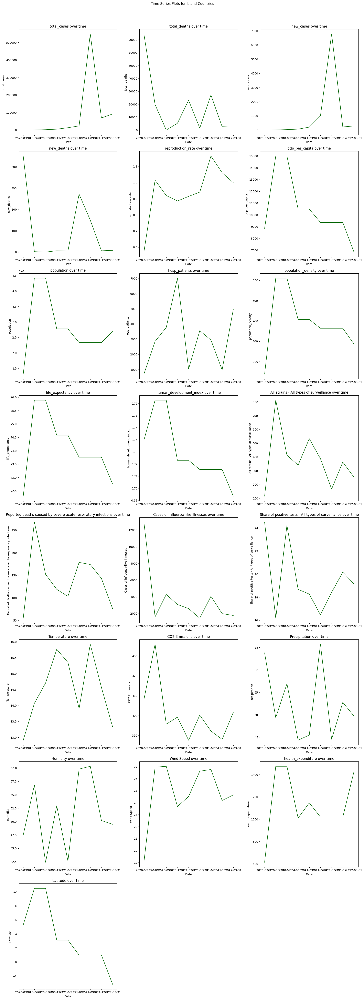

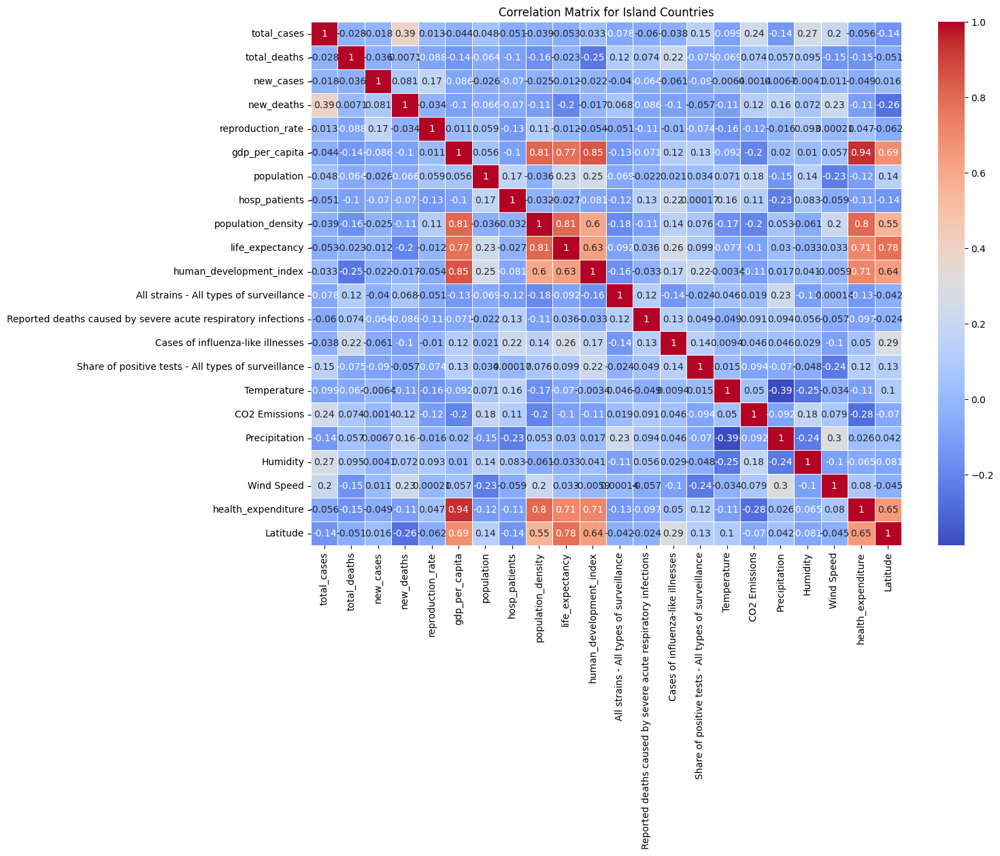

In [19]:
#EDA

# Define country lists for each category
developed_nations = ['Bahrain', 'Finland','France', 'Germany','Japan', 'Ireland', 'Italy', 'Netherlands','Singapore','Switzerland', 'United Kingdom', 'United States']
developing_nations = ['China','India','Peru','Philippines','Brazil','Bangladesh','Angola','Haiti','Indonesia','Afghanistan',]
underdeveloped_nations = ['Nigeria', 'Chad', 'Ethiopia', 'Mali', 'Madagascar','Niger','Mozambique','kenya', 'Tanzania','Somalia','Uganda','Central African Republic']
island_nations = ['Marshall Islands', 'St. Vincent and the Grenadines', 'Jamaica', 'Tonga', 'Kiribati', 'Dominica', 'Samoa', 'Fiji', 'Vanuatu', 'Solomon Islands', 'Maldives', 'Malta', 'Sri Lanka']

# Check for missing values and handle them
project_merged_data = project_merged_data.dropna(subset=['date', 'total_cases', 'total_deaths'])

# Define a function for EDA
def perform_eda(data, category_name):
    print(f"\n--- EDA for {category_name} Countries ---")

    if data.empty:
        print(f"No data available for {category_name} countries.")
        return

    # Check the dimensions of the dataset
    print("Dimensions of the dataset:", data.shape)

    # Display the first few rows
    print("\nFirst few rows of the dataset:")
    print(data.head())

    # Check for missing values
    print("\nMissing values in each column:")
    print(data.isnull().sum())

    # Summary statistics
    print("\nSummary statistics for numerical variables:")
    print(data.describe())

# Univariate Analysis with line plots
    numeric_columns = data.select_dtypes(include=[np.number]).columns
    num_plots = len(numeric_columns)
    num_cols = 3
    num_rows = (num_plots // num_cols) + (num_plots % num_cols > 0)

    plt.figure(figsize=(18, num_rows * 6))
    for i, column in enumerate(numeric_columns):
        plt.subplot(num_rows, num_cols, i + 1)
        sns.lineplot(x=data['date'], y=data[column], errorbar=None, color='darkgreen')
        plt.title(f'{column} over time')
        plt.xlabel('Date')
        plt.ylabel(column)

    plt.tight_layout()
    plt.suptitle(f'Time Series Plots for {category_name} Countries', y=1.02)
    plt.show()



    # Correlation matrix
    numeric_data = data.select_dtypes(include=[np.number])
    if not numeric_data.empty:
        plt.figure(figsize=(14, 10))
        correlation_matrix = numeric_data.corr()
        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
        plt.title(f'Correlation Matrix for {category_name} Countries')
        plt.show()
    else:
        print("No numeric data available for correlation matrix.")


# Filter data for each category
developed_countries_data = project_merged_data[project_merged_data['location'].isin(developed_nations)]
developing_countries_data = project_merged_data[project_merged_data['location'].isin(developing_nations)]
underdeveloped_countries_data = project_merged_data[project_merged_data['location'].isin(underdeveloped_nations)]
island_countries_data = project_merged_data[project_merged_data['location'].isin(island_nations)]

# Perform EDA for each category
perform_eda(developed_countries_data, "Developed")
perform_eda(developing_countries_data, "Developing")
perform_eda(underdeveloped_countries_data, "Underdeveloped")
perform_eda(island_countries_data, "Island")

developed - XGBoost - total_cases - MSE: 0.3379294299355037, RMSE: 0.5813169788811468, MAE: 0.3300263154478946, R2: 0.9999999999999667


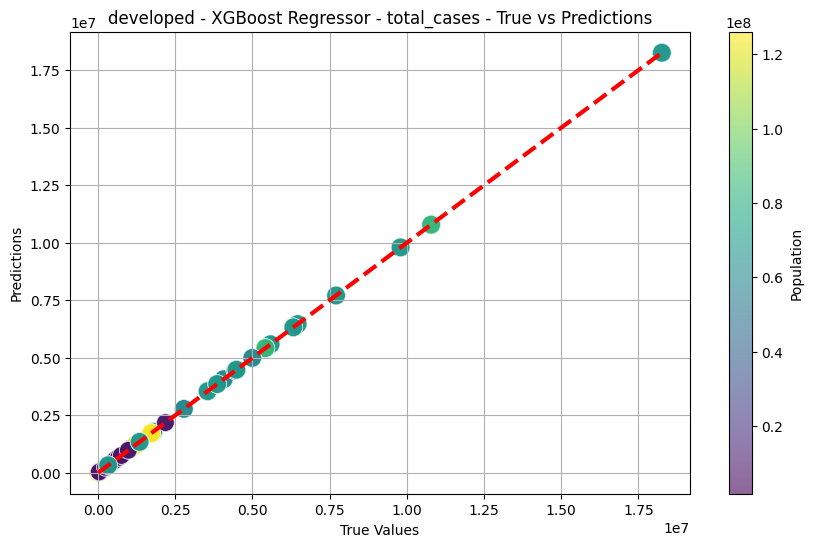

developed - XGBoost - total_deaths - MSE: 3.412243837325527e-05, RMSE: 0.0058414414636504975, MAE: 0.004075324010976867, R2: 0.9999999999999849


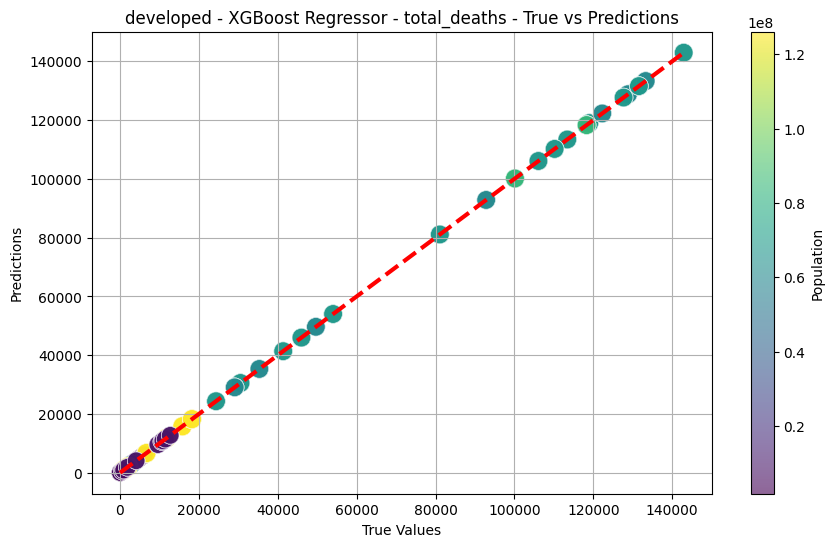

developed - XGBoost - All strains - All types of surveillance - MSE: 2.711942960974596e-07, RMSE: 0.0005207631861964319, MAE: 0.00033223712360500626, R2: 0.9999999999995084


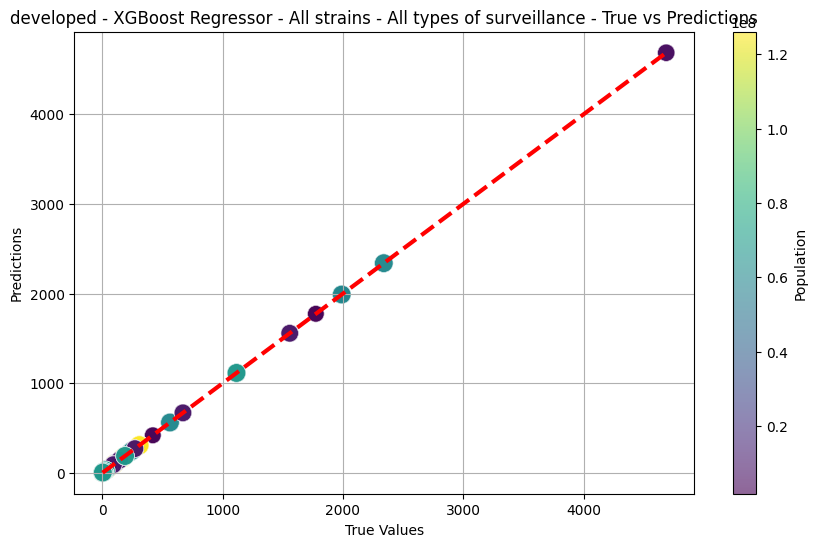

developed - XGBoost - Reported deaths caused by severe acute respiratory infections - MSE: 2.505096919457811e-07, RMSE: 0.000500509432424386, MAE: 0.000345772518700342, R2: 0.999999999995215


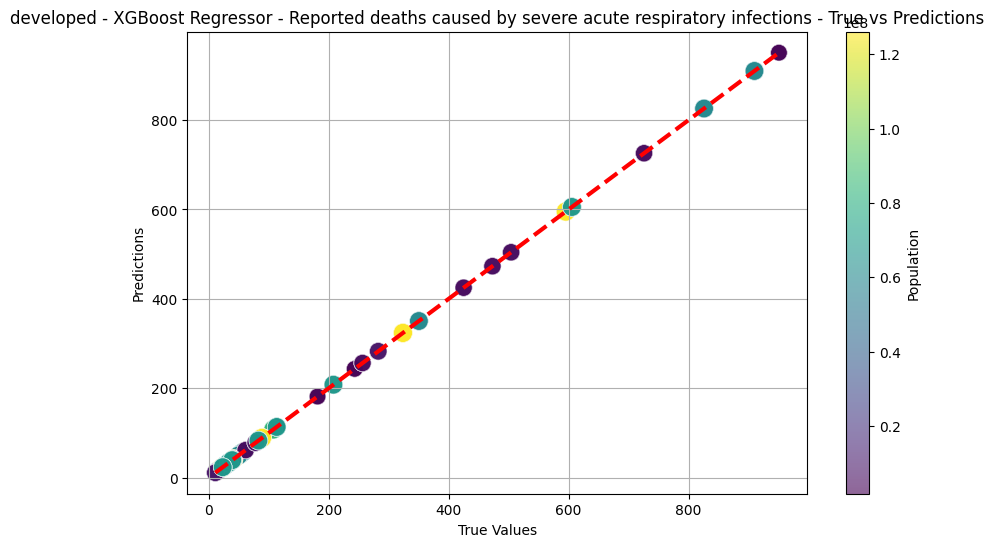

developing - XGBoost - total_cases - MSE: 0.9680554211002301, RMSE: 0.9838980745484921, MAE: 0.5779773981901144, R2: 0.9999999999999867


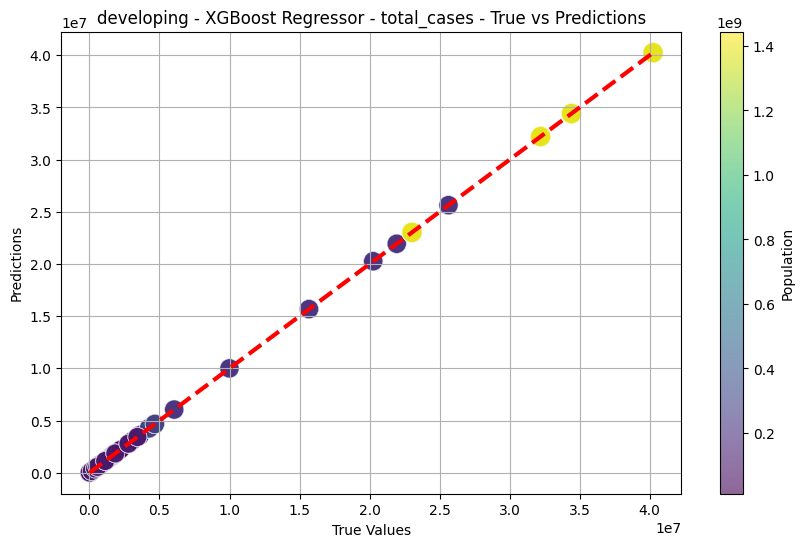

developing - XGBoost - total_deaths - MSE: 0.0004427066846301121, RMSE: 0.021040596109191206, MAE: 0.013656907955749874, R2: 0.9999999999999819


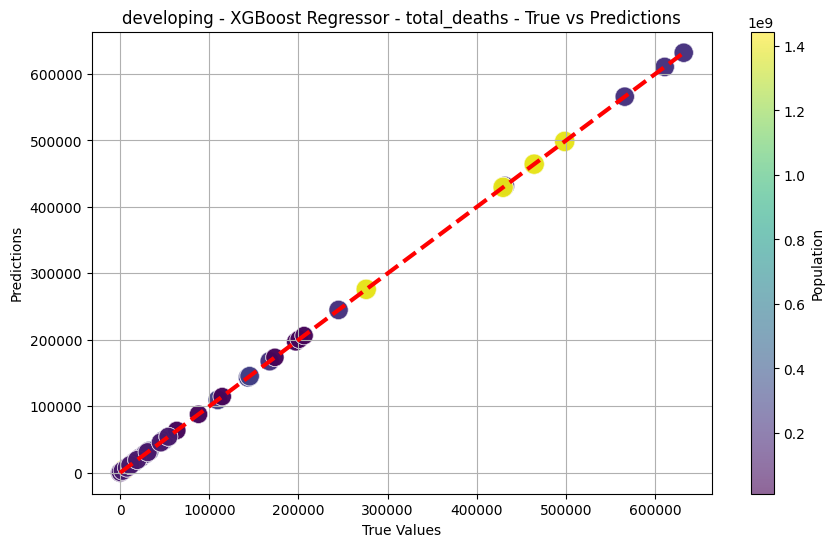

developing - XGBoost - All strains - All types of surveillance - MSE: 2.6666956422404863e-07, RMSE: 0.0005164005850345724, MAE: 0.0003824397580826059, R2: 0.9999999999993945


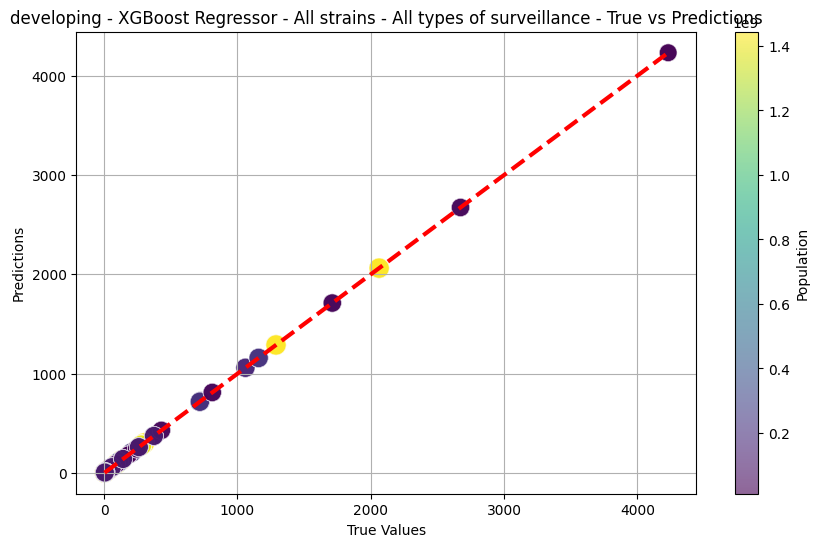

developing - XGBoost - Reported deaths caused by severe acute respiratory infections - MSE: 1.8338037025746213e-07, RMSE: 0.00042822934305984, MAE: 0.00031808260324484326, R2: 0.9999999999981971


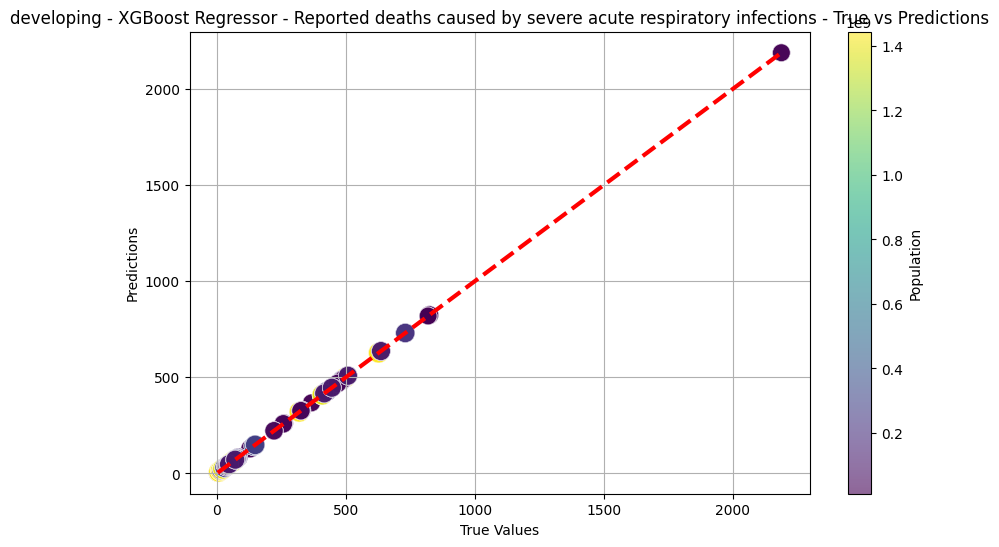

underdeveloped - XGBoost - total_cases - MSE: 0.00033061376632676024, RMSE: 0.018182787639049198, MAE: 0.013730741023144328, R2: 0.9999999999999649


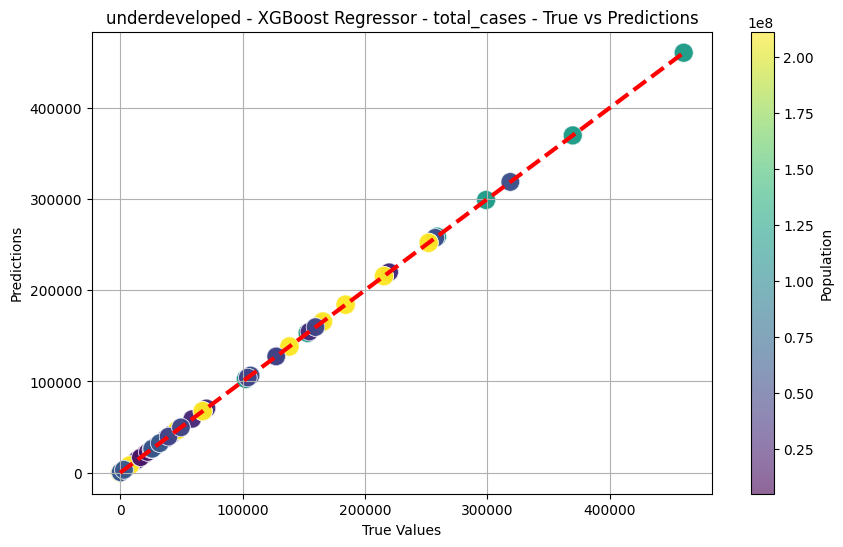

underdeveloped - XGBoost - total_deaths - MSE: 2.9316022834463647e-07, RMSE: 0.0005414427285915256, MAE: 0.00038247268689952524, R2: 0.9999999999998904


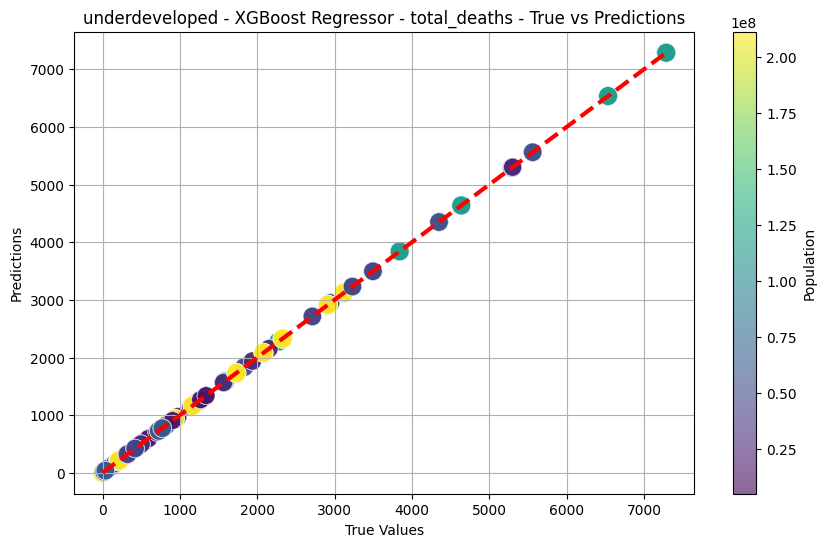

underdeveloped - XGBoost - All strains - All types of surveillance - MSE: 3.7225224053988375e-07, RMSE: 0.0006101247745665502, MAE: 0.00040058960203285713, R2: 0.999999999999391


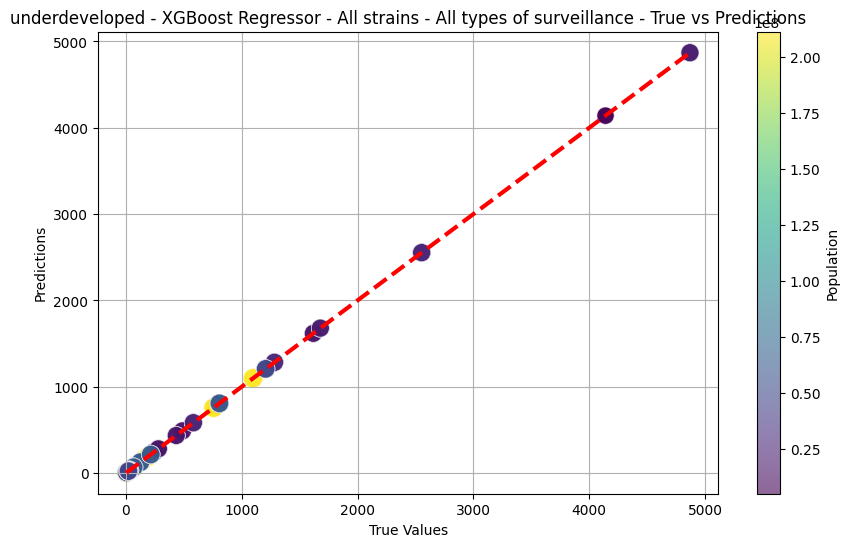

underdeveloped - XGBoost - Reported deaths caused by severe acute respiratory infections - MSE: 4.391265391592227e-07, RMSE: 0.0006626662351132904, MAE: 0.0003918421214495345, R2: 0.9999999999892367


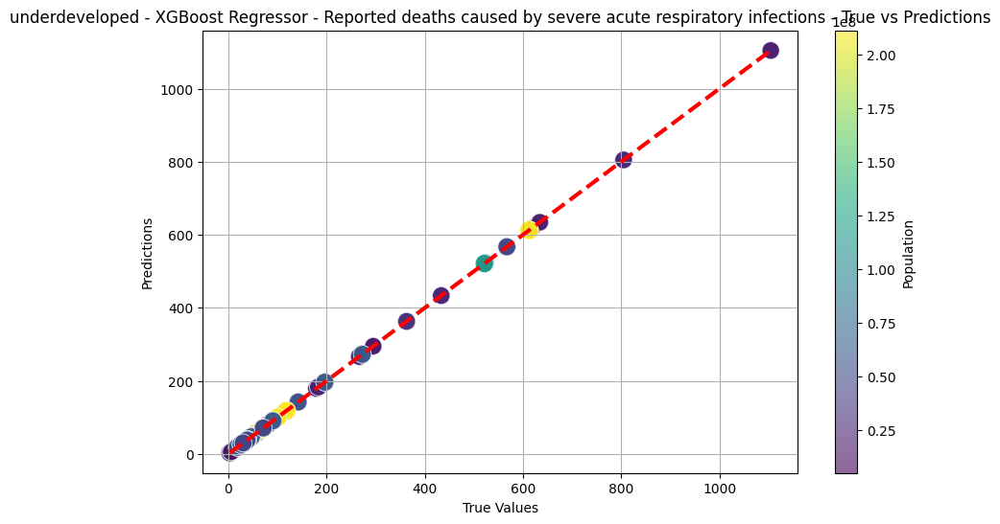

island - XGBoost - total_cases - MSE: 0.01752403798506992, RMSE: 0.132378389418628, MAE: 0.03632676270709441, R2: 0.9999999999999609


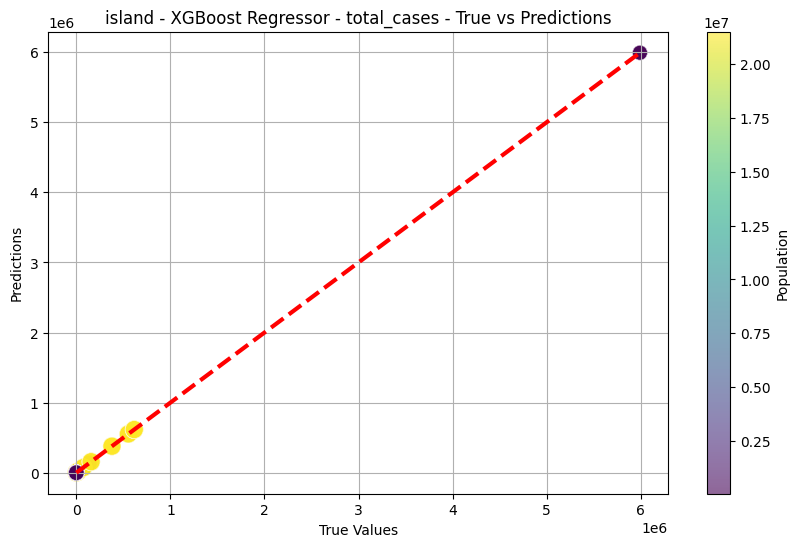

island - XGBoost - total_deaths - MSE: 1.247757951664393e-05, RMSE: 0.0035323617477042084, MAE: 0.0015862077690565913, R2: 0.9999999999999947


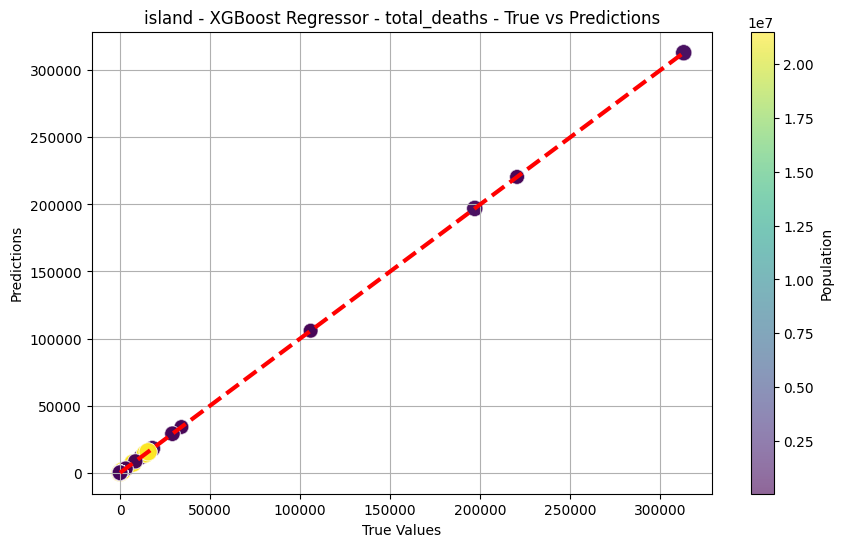

island - XGBoost - All strains - All types of surveillance - MSE: 2.654648746317864e-07, RMSE: 0.0005152328353587205, MAE: 0.00031116558956085784, R2: 0.999999999999284


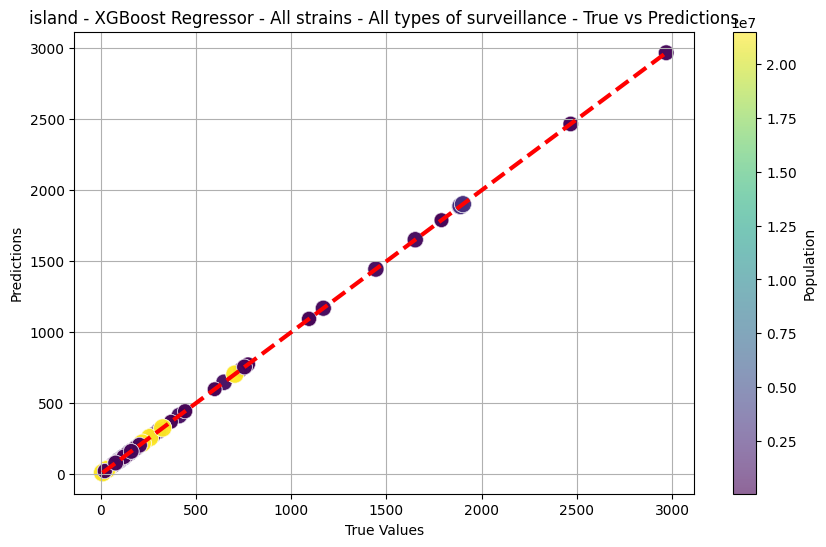

island - XGBoost - Reported deaths caused by severe acute respiratory infections - MSE: 4.1768829230550967e-07, RMSE: 0.0006462880877020012, MAE: 0.0003644629166680402, R2: 0.9999999999912014


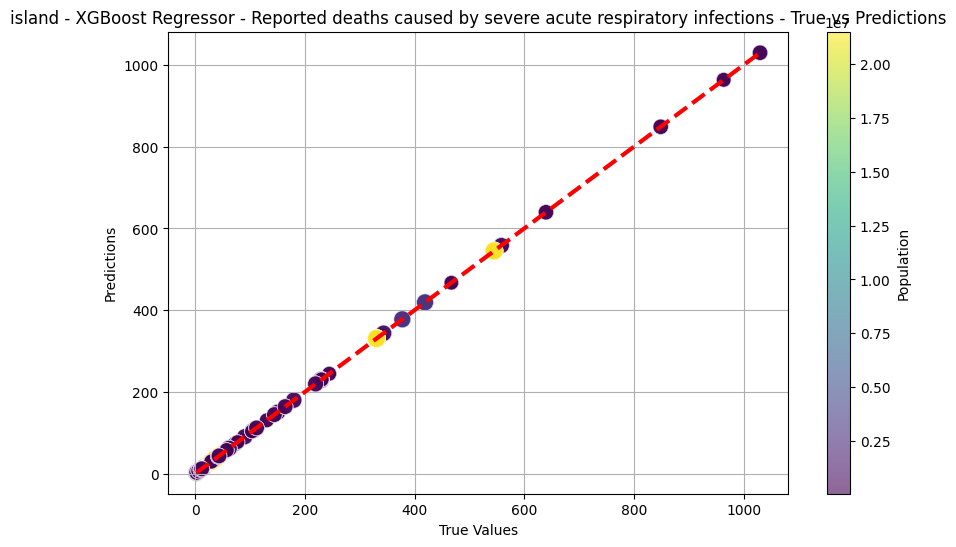

In [20]:
#MODEL
#XGBOOST
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import xgboost as xgb

# Load your merged data here
project_merged_data = pd.read_csv("/content/drive/MyDrive/FINAL PROJECT/Project_merged_data.csv")

# Country list dictionary
country_categories = {
    "developed": ['Bahrain', 'Finland', 'France', 'Germany', 'Japan', 'Ireland', 'Italy', 'Netherlands', 'Singapore', 'Switzerland', 'United Kingdom', 'United States'],
    "developing": ['China', 'India', 'Peru', 'Philippines', 'Brazil', 'Bangladesh', 'Angola', 'Haiti', 'Indonesia', 'Afghanistan'],
    "underdeveloped": ['Nigeria', 'Chad', 'Ethiopia', 'Mali', 'Madagascar', 'Niger', 'Mozambique', 'Kenya', 'Tanzania', 'Somalia', 'Uganda', 'Central African Republic'],
    "island": ['Marshall Islands', 'St. Vincent and the Grenadines', 'Jamaica', 'Tonga', 'Kiribati', 'Dominica', 'Samoa', 'Fiji', 'Vanuatu', 'Solomon Islands', 'Maldives', 'Malta', 'Sri Lanka']
}

# Define target variables for both COVID-19 and Influenza
target_variables = ['total_cases', 'total_deaths', 'All strains - All types of surveillance', 'Reported deaths caused by severe acute respiratory infections']

# Define feature variables (excluding date, location, and population)
features = [col for col in project_merged_data.columns if col not in target_variables + ['date', 'location', 'population']]

def preprocess_data(data):
    # One-hot encode categorical variables if any
    data = pd.get_dummies(data, drop_first=True)
    return data

def train_evaluate_xgboost(data, category, target):
    X = data[features]
    y = data[target]
    populations = data['population']  # Population data

    # Ensure the target is numeric, handling errors
    y = pd.to_numeric(y, errors='coerce')

    # Handle missing or non-numeric values in the target variable
    if y.isnull().sum() > 0:
        print(f"Warning: Missing or non-numeric data in target for {category} - {target}. Filling with 0.")
        y = y.fillna(0)  # Optionally, use a different strategy, like y.fillna(y.mean())

    # Split data into training and validation sets
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

    # Define the XGBoost model with early stopping
    model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42, eval_metric='rmse', early_stopping_rounds=10)

    # Train the model with validation data
    model.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_val, y_val)], verbose=False)

    # Make predictions on the entire dataset for evaluation
    y_pred = model.predict(X)

    mse, rmse, mae, r2 = evaluate_model(y, y_pred)
    print(f'{category} - XGBoost - {target} - MSE: {mse}, RMSE: {rmse}, MAE: {mae}, R2: {r2}')
    plot_predictions(y, y_pred, populations, f"{category} - XGBoost Regressor - {target} - True vs Predictions")
    return model

def evaluate_model(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mse, rmse, mae, r2

def plot_predictions(y_true, y_pred, populations, title):
    plt.figure(figsize=(10, 6))  # Original rectangular shape

    # Adjust point size
    sc = plt.scatter(y_true, y_pred, c=populations, cmap='viridis', s=np.log1p(populations) * 10,
                     alpha=0.6, edgecolors='w', linewidth=0.5)

    # Plotting the diagonal line
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=3)

    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.title(title)
    plt.grid(True)

    # Add color bar (keeping population reference)
    cbar = plt.colorbar(sc)
    cbar.set_label('Population')

    plt.show()

# Train and evaluate for each category and target
for category, country_list in country_categories.items():
    filtered_data = project_merged_data[project_merged_data['location'].isin(country_list)]
    filtered_data = filtered_data.drop(columns=['location'])
    filtered_data = preprocess_data(filtered_data)
    for target in target_variables:
        model = train_evaluate_xgboost(filtered_data, category, target)


developed - Bagging Regressor - total_cases - MSE: 2340018603974.739, RMSE: 1529711.9349651223, MAE: 1022607.7777113955, R2: 0.7692293193333932


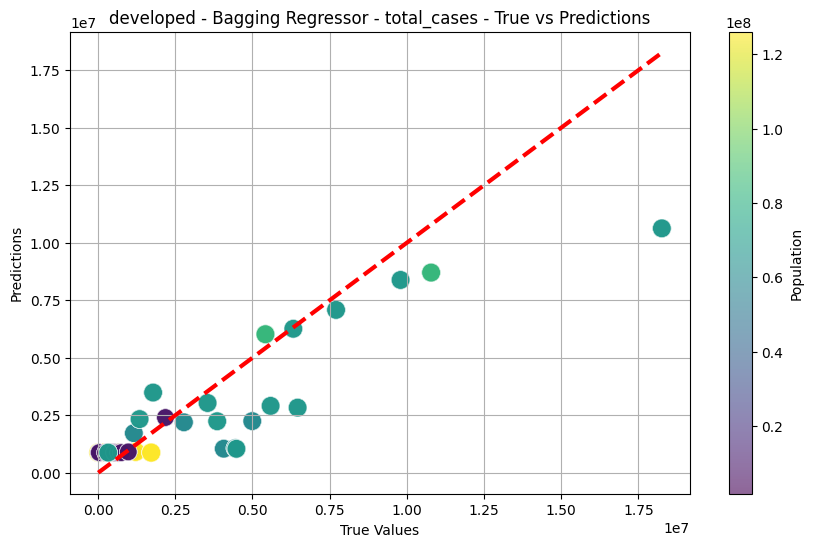

developed - Bagging Regressor - total_deaths - MSE: 371191244.3562666, RMSE: 19266.32410077923, MAE: 13314.578288481385, R2: 0.8357089080500135


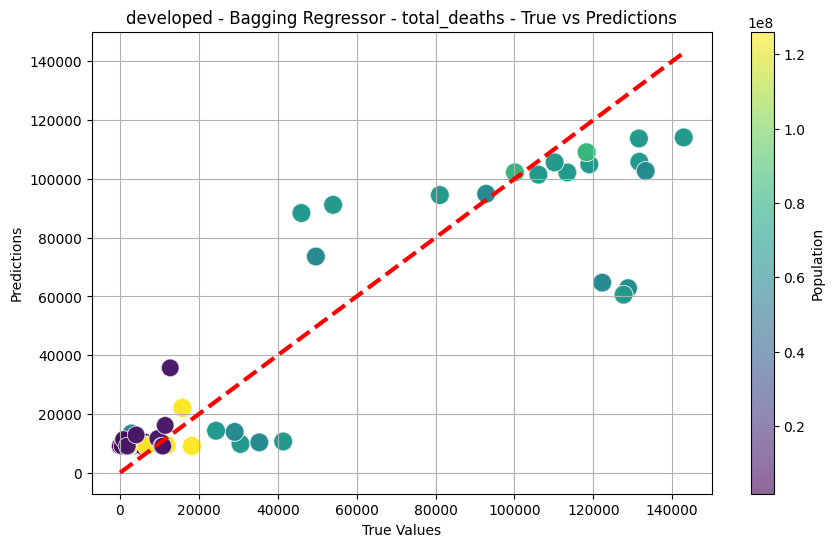

developed - Bagging Regressor - All strains - All types of surveillance - MSE: 60190.88099976781, RMSE: 245.338299088764, MAE: 131.81912248085862, R2: 0.8908817316266435


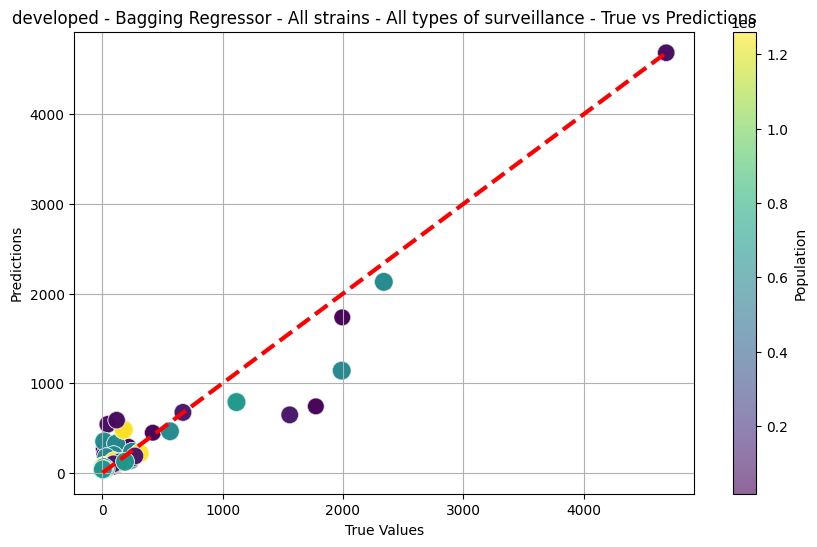

developed - Bagging Regressor - Reported deaths caused by severe acute respiratory infections - MSE: 16782.565982013413, RMSE: 129.54754332681657, MAE: 92.64489576038582, R2: 0.6794368673860364


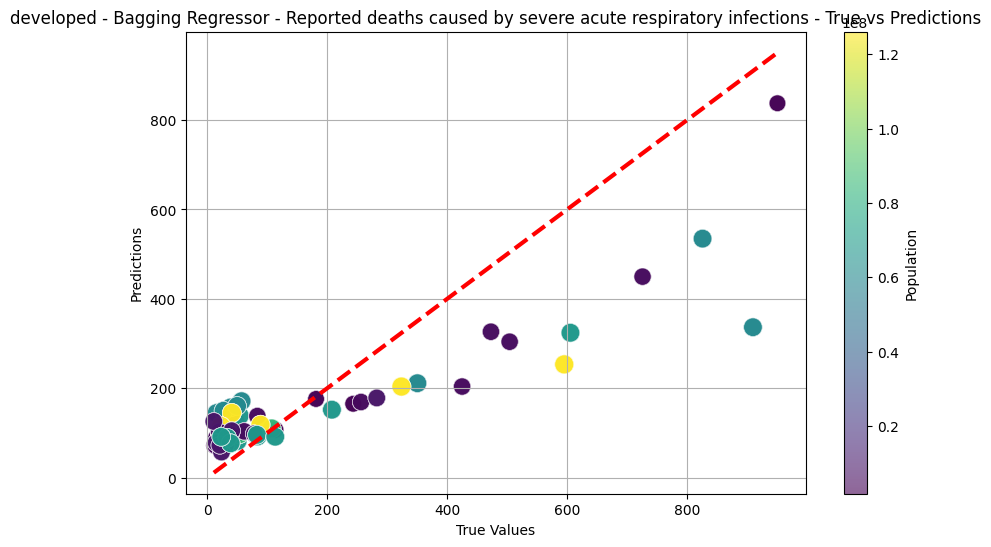

developing - Bagging Regressor - total_cases - MSE: 5810435172.57319, RMSE: 76226.2105353086, MAE: 25055.56977819734, R2: 0.9999202035752492


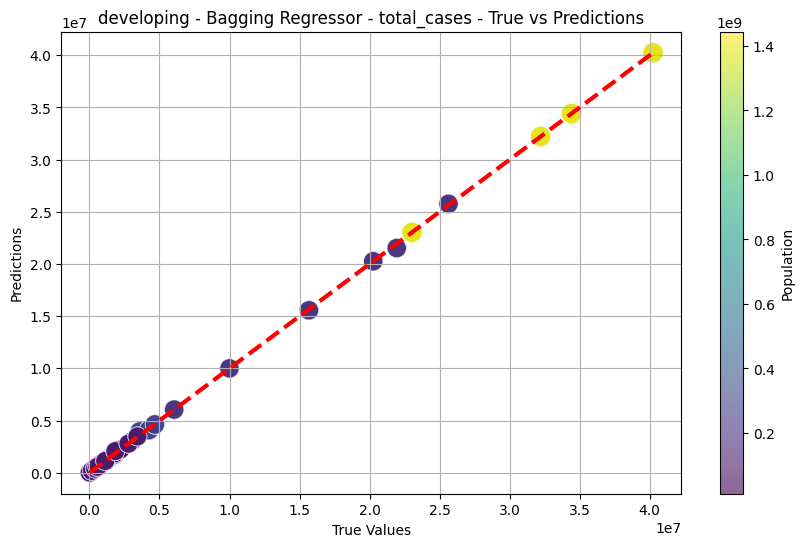

developing - Bagging Regressor - total_deaths - MSE: 8673201.472478125, RMSE: 2945.029961219092, MAE: 904.9328890698824, R2: 0.9996456682289105


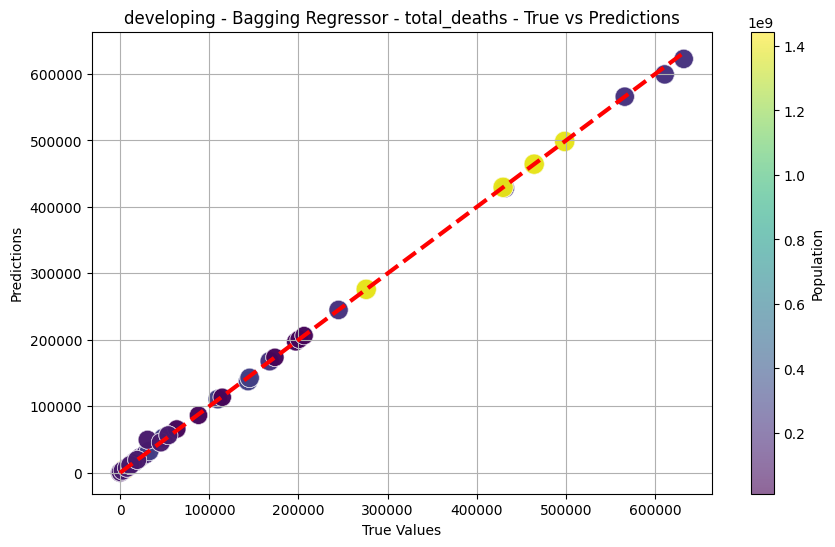

developing - Bagging Regressor - All strains - All types of surveillance - MSE: 867.1070202142782, RMSE: 29.446680971109092, MAE: 12.49465696465696, R2: 0.9980309505645296


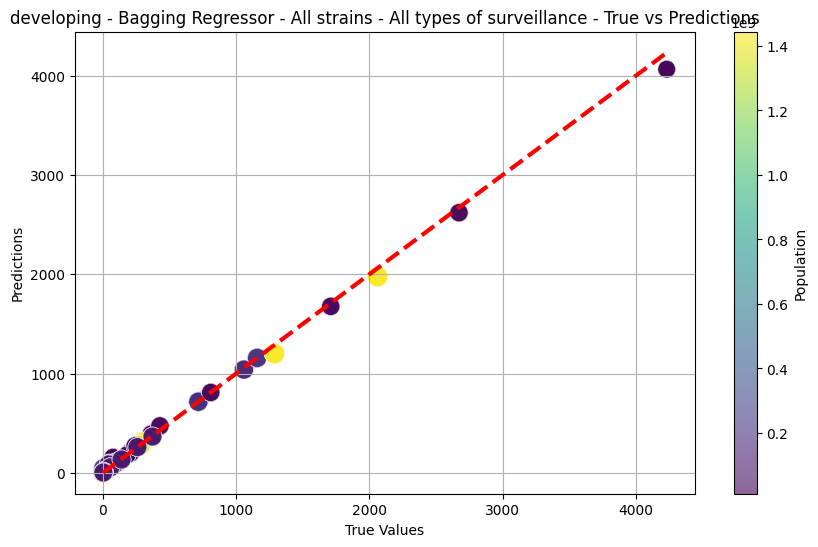

developing - Bagging Regressor - Reported deaths caused by severe acute respiratory infections - MSE: 52.85097677914712, RMSE: 7.2698677277614285, MAE: 3.157151767151842, R2: 0.9994803985078482


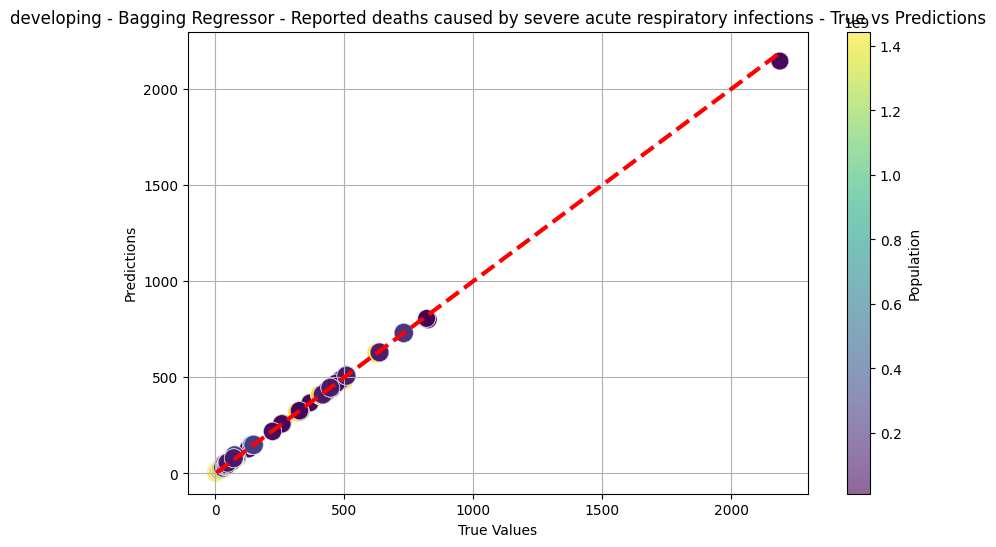

underdeveloped - Bagging Regressor - total_cases - MSE: 3173954.6540215337, RMSE: 1781.5596128172456, MAE: 802.5213713937687, R2: 0.9996628040044837


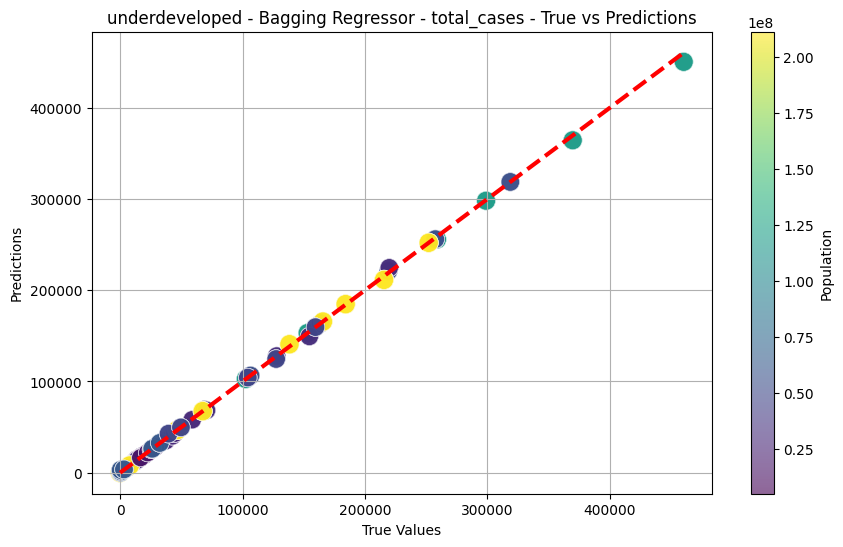

underdeveloped - Bagging Regressor - total_deaths - MSE: 1162.909711678509, RMSE: 34.101462016730444, MAE: 15.59010423872464, R2: 0.9995653851867178


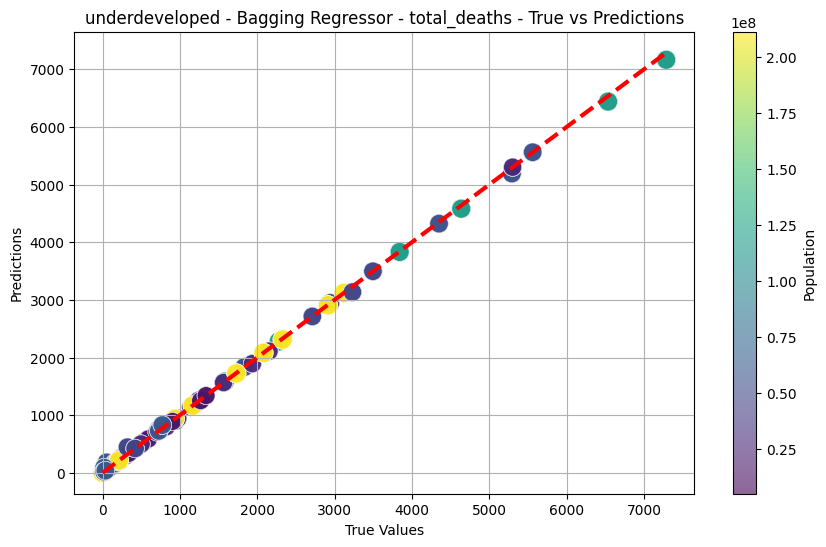

underdeveloped - Bagging Regressor - All strains - All types of surveillance - MSE: 526.5730344030742, RMSE: 22.94717922540969, MAE: 8.243366515837284, R2: 0.9991385321069292


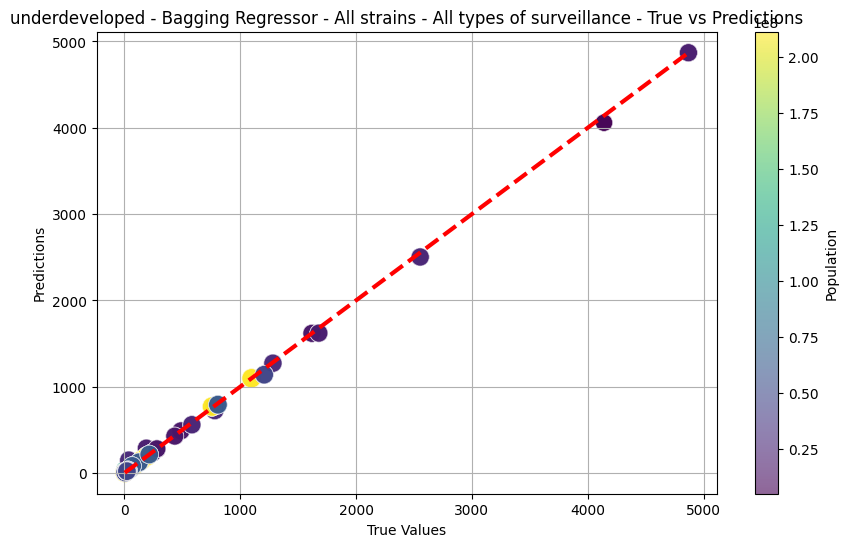

underdeveloped - Bagging Regressor - Reported deaths caused by severe acute respiratory infections - MSE: 49.95931166724708, RMSE: 7.06819012670479, MAE: 3.08750226244347, R2: 0.9987754664615678


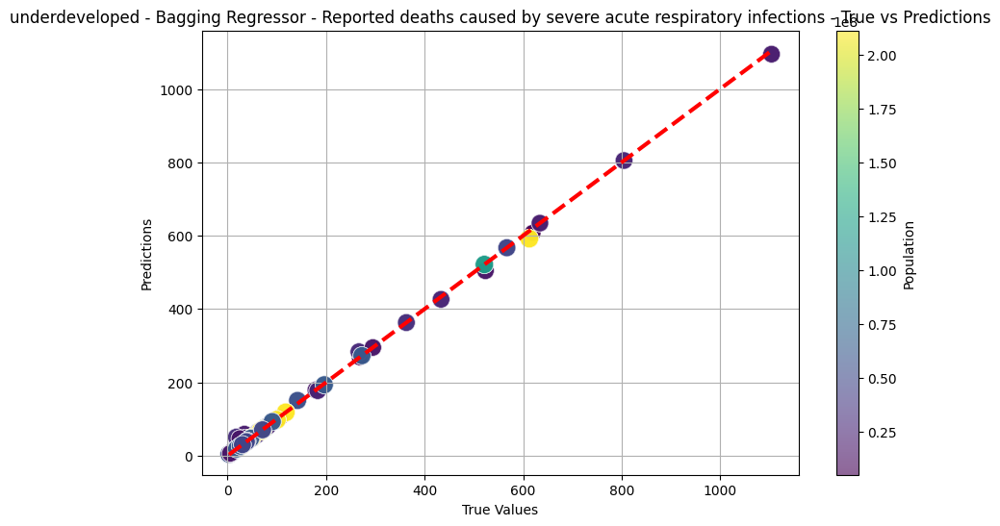

island - Bagging Regressor - total_cases - MSE: 1711320572.8091652, RMSE: 41368.110578187705, MAE: 9317.593568994625, R2: 0.9961823621068252


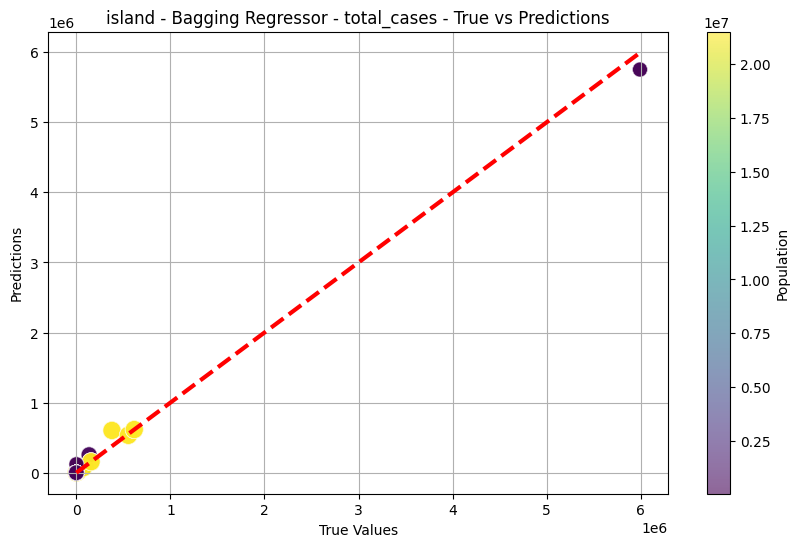

island - Bagging Regressor - total_deaths - MSE: 1793946.462406646, RMSE: 1339.3828662509634, MAE: 424.1661248004386, R2: 0.9992317106803121


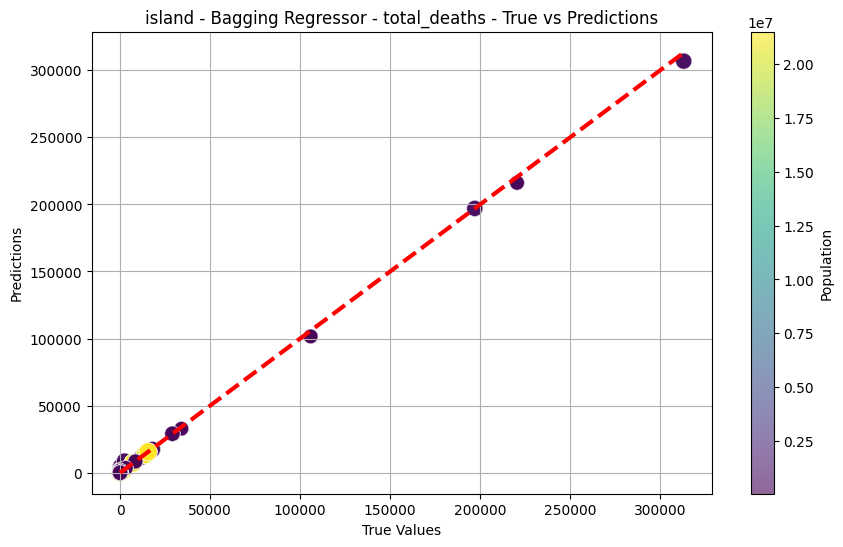

island - Bagging Regressor - All strains - All types of surveillance - MSE: 349.2522257100597, RMSE: 18.68829113937547, MAE: 9.159173076923205, R2: 0.9990579658022917


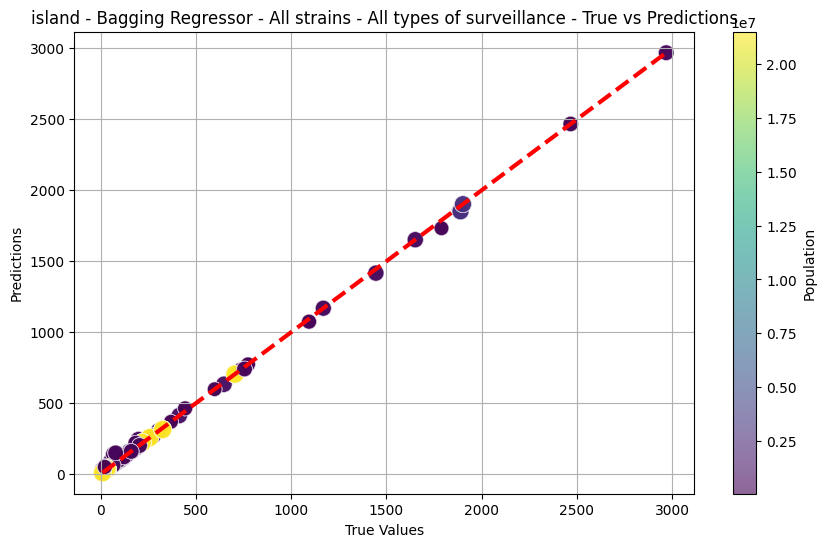

island - Bagging Regressor - Reported deaths caused by severe acute respiratory infections - MSE: 69.27968491124274, RMSE: 8.32344189090323, MAE: 4.2230384615384935, R2: 0.9985406245928222


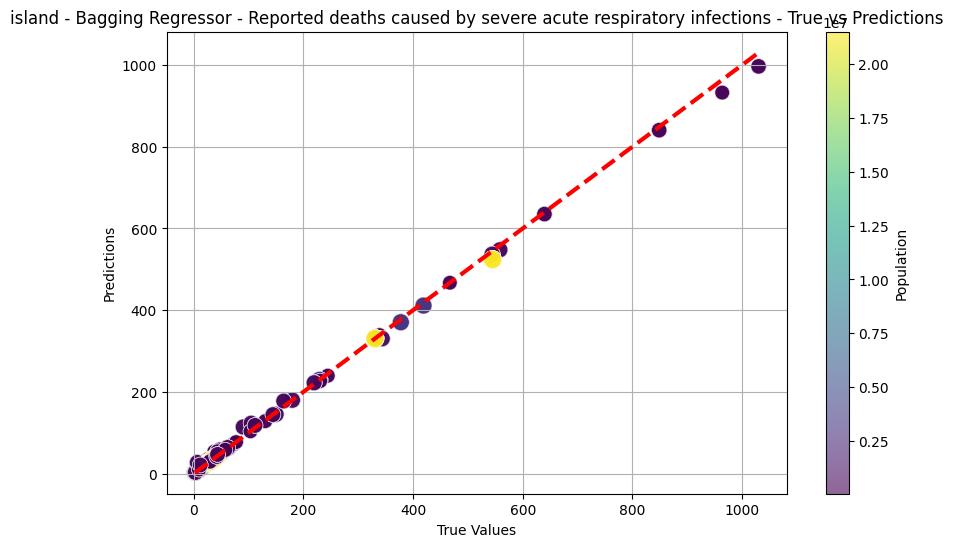

In [21]:
#BAGGING REGRESSION
from sklearn.ensemble import BaggingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import numpy as np

# Define target variables for both COVID-19 and Influenza
target_variables = ['total_cases', 'total_deaths', 'All strains - All types of surveillance', 'Reported deaths caused by severe acute respiratory infections']

# Function to evaluate model performance
def evaluate_model(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mse, rmse, mae, r2

# Function to plot predictions with color bar
def plot_predictions(y_true, y_pred, populations, title):
    plt.figure(figsize=(10, 6))
    sc = plt.scatter(y_true, y_pred, c=populations, cmap='viridis', s=np.log1p(populations) * 10,
                     alpha=0.6, edgecolors='w', linewidth=0.5)
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=3)
    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.title(title)
    plt.grid(True)
    cbar = plt.colorbar(sc)
    cbar.set_label('Population')
    plt.show()

# Function to preprocess data
def preprocess_data(data):
    # One-hot encode categorical variables if any
    data = pd.get_dummies(data, drop_first=True)
    return data

# Function to train and evaluate Bagging Regressor
def train_evaluate_bagging(data, category, target):
    X = data[features]
    y = data[target]
    populations = data['population']  # Population data

    # Ensure the target is numeric, handling errors
    y = pd.to_numeric(y, errors='coerce')

    # Handle missing or non-numeric values in the target variable
    if y.isnull().sum() > 0:
        print(f"Warning: Missing or non-numeric data in target for {category} - {target}. Filling with 0.")
        y = y.fillna(0)

    # Initialize and train the Bagging Regressor
    base_model = DecisionTreeRegressor(random_state=42)
    model = BaggingRegressor(estimator=base_model, n_estimators=50, random_state=42)
    model.fit(X, y)
    y_pred = model.predict(X)

    mse, rmse, mae, r2 = evaluate_model(y, y_pred)
    print(f'{category} - Bagging Regressor - {target} - MSE: {mse}, RMSE: {rmse}, MAE: {mae}, R2: {r2}')
    plot_predictions(y, y_pred, populations, f"{category} - Bagging Regressor - {target} - True vs Predictions")
    return model

# Filter and preprocess data
def filter_and_preprocess_data(data, country_list):
    filtered_data = data[data['location'].isin(country_list)]
    filtered_data = filtered_data.drop(columns=['location'])
    filtered_data = preprocess_data(filtered_data)
    return filtered_data

# Define country lists for each category
country_categories = {
    "developed": ['Bahrain', 'Finland', 'France', 'Germany', 'Japan', 'Ireland', 'Italy', 'Netherlands', 'Singapore', 'Switzerland', 'United Kingdom', 'United States'],
    "developing": ['China', 'India', 'Peru', 'Philippines', 'Brazil', 'Bangladesh', 'Angola', 'Haiti', 'Indonesia', 'Afghanistan'],
    "underdeveloped": ['Nigeria', 'Chad', 'Ethiopia', 'Mali', 'Madagascar', 'Niger', 'Mozambique', 'Kenya', 'Tanzania', 'Somalia', 'Uganda', 'Central African Republic'],
    "island": ['Marshall Islands', 'St. Vincent and the Grenadines', 'Jamaica', 'Tonga', 'Kiribati', 'Dominica', 'Samoa', 'Fiji', 'Vanuatu', 'Solomon Islands', 'Maldives', 'Malta', 'Sri Lanka']
}

# Define features
features = [col for col in project_merged_data.columns if col not in target_variables + ['date', 'location', 'population']]

# Apply the Bagging model to each category and target
for category, country_list in country_categories.items():
    filtered_data = filter_and_preprocess_data(project_merged_data, country_list)
    for target in target_variables:
        model = train_evaluate_bagging(filtered_data, category, target)


developed - Voting Regressor - total_cases - MSE: 337032668.93394494, RMSE: 18358.44952423665, MAE: 7786.776674801677, R2: 0.9999667621196324


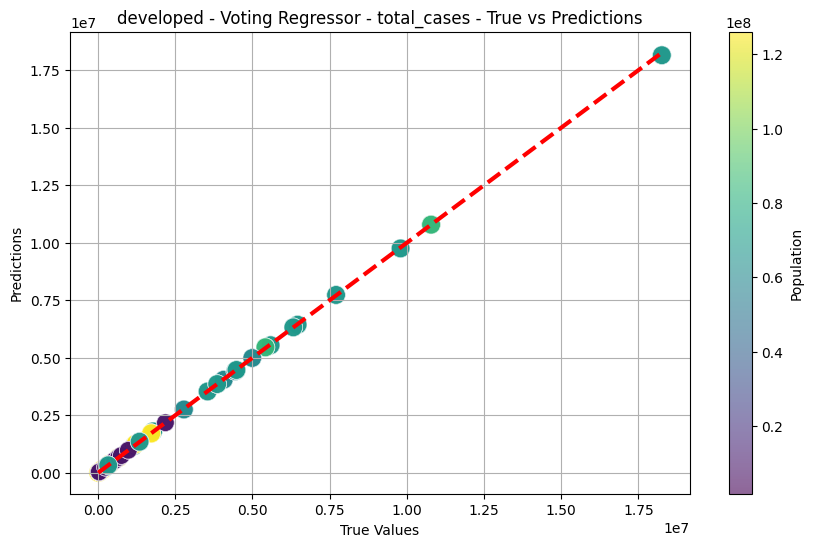

developed - Voting Regressor - total_deaths - MSE: 65289.44533946736, RMSE: 255.5179941598387, MAE: 130.93237041876947, R2: 0.9999711025665861


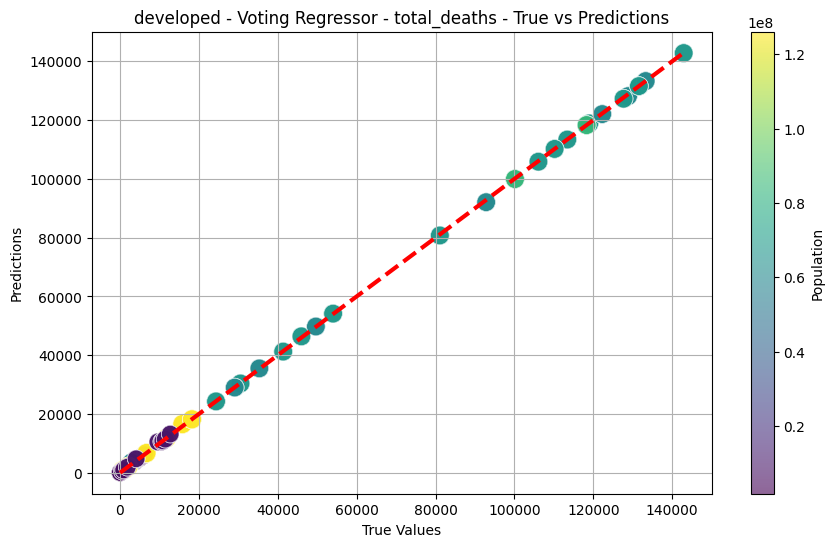

developed - Voting Regressor - All strains - All types of surveillance - MSE: 68.19292163098672, RMSE: 8.257900558313034, MAE: 3.329178788041411, R2: 0.9998763750687796


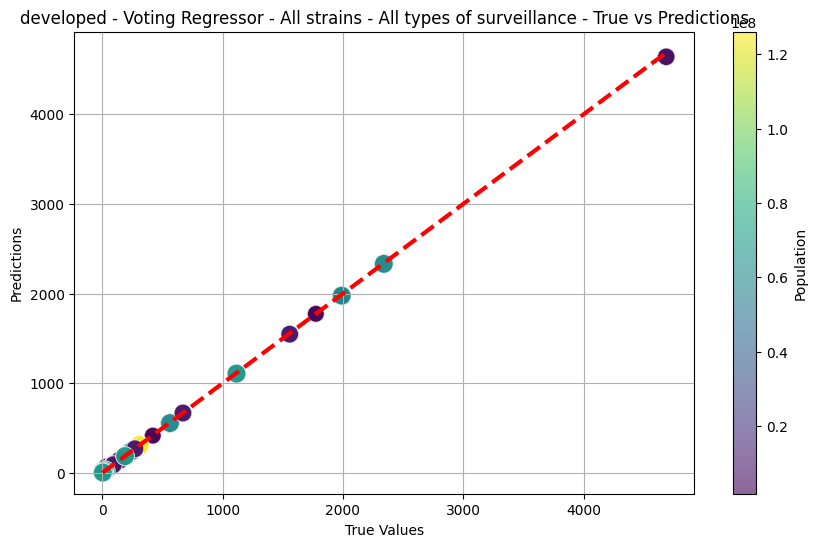

developed - Voting Regressor - Reported deaths caused by severe acute respiratory infections - MSE: 19.734651279334575, RMSE: 4.442370007027169, MAE: 1.9487135685073596, R2: 0.9996230492022539


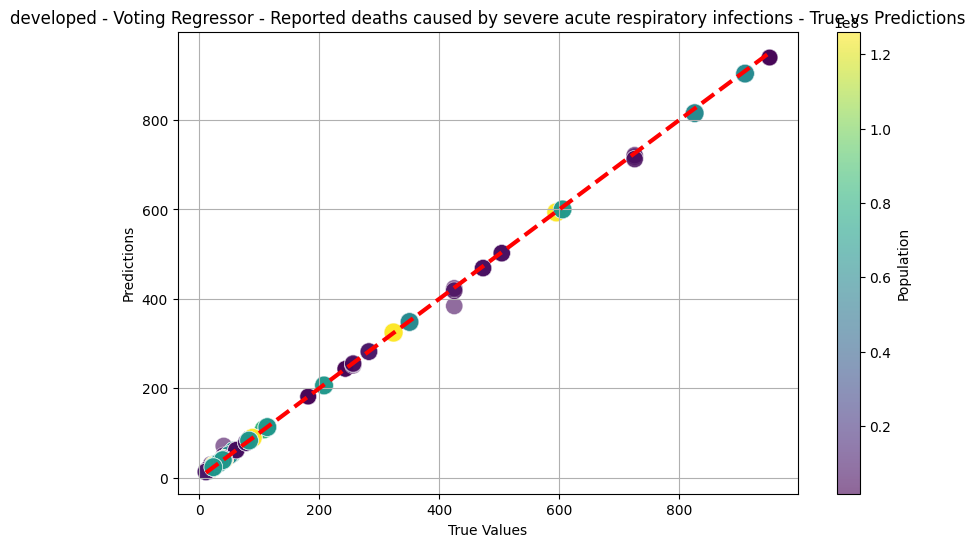

developing - Voting Regressor - total_cases - MSE: 1148036680.5099506, RMSE: 33882.68998338164, MAE: 12192.243491134197, R2: 0.9999842336727169


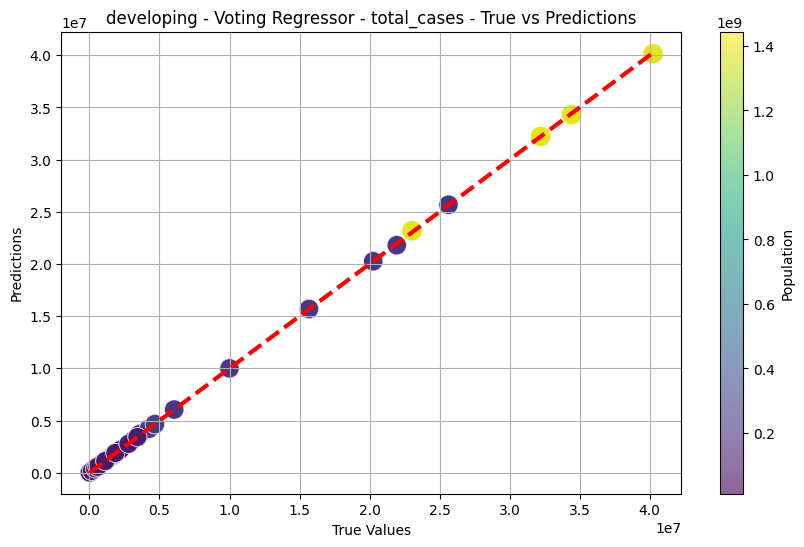

developing - Voting Regressor - total_deaths - MSE: 499361.189302612, RMSE: 706.6549294405381, MAE: 285.99806121782274, R2: 0.9999795992823203


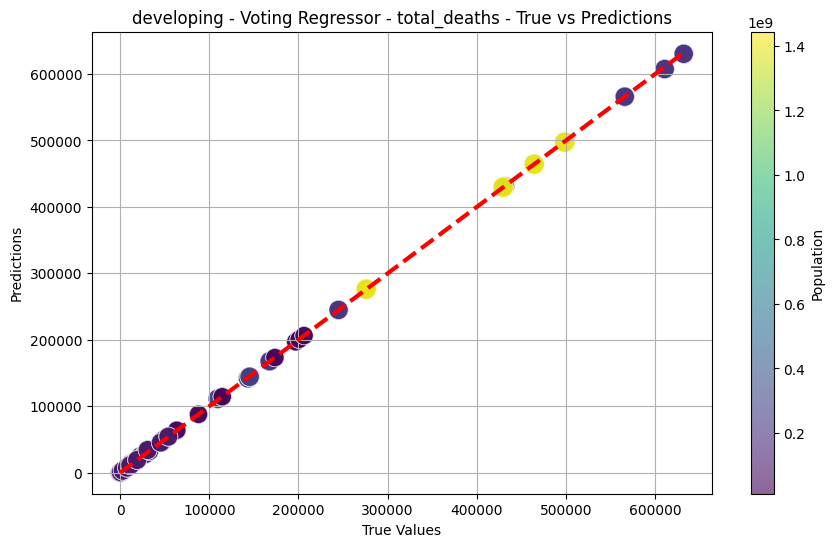

developing - Voting Regressor - All strains - All types of surveillance - MSE: 64.11844135100569, RMSE: 8.007399162712302, MAE: 4.274058145944715, R2: 0.9998543981563957


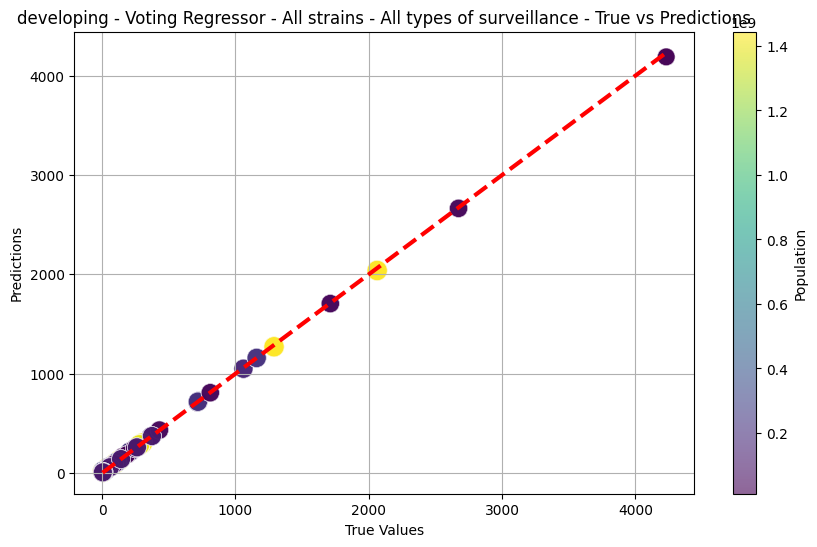

developing - Voting Regressor - Reported deaths caused by severe acute respiratory infections - MSE: 4.725159914585834, RMSE: 2.173743295466563, MAE: 1.286867918859126, R2: 0.9999535448483282


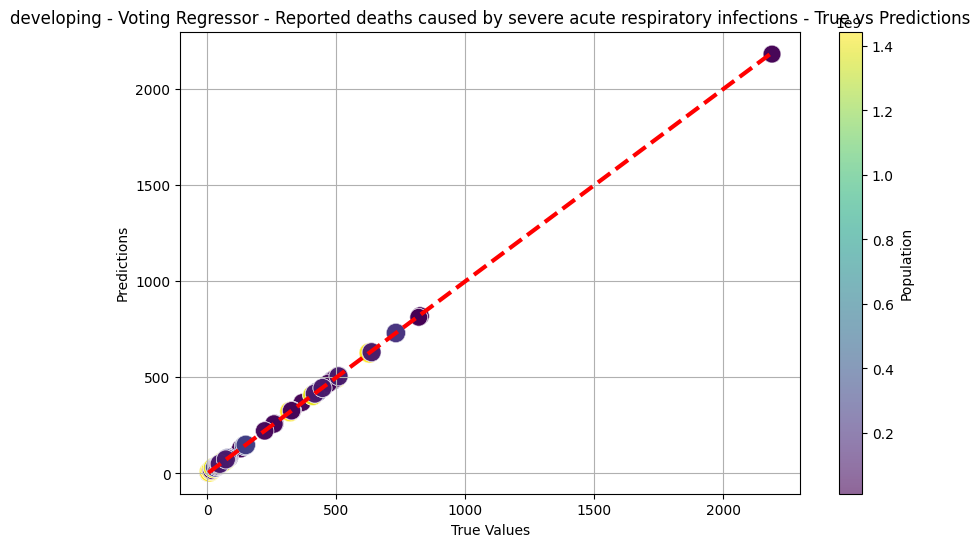

underdeveloped - Voting Regressor - total_cases - MSE: 260463.50210972928, RMSE: 510.3562501916963, MAE: 263.46063976576164, R2: 0.9999723287634944


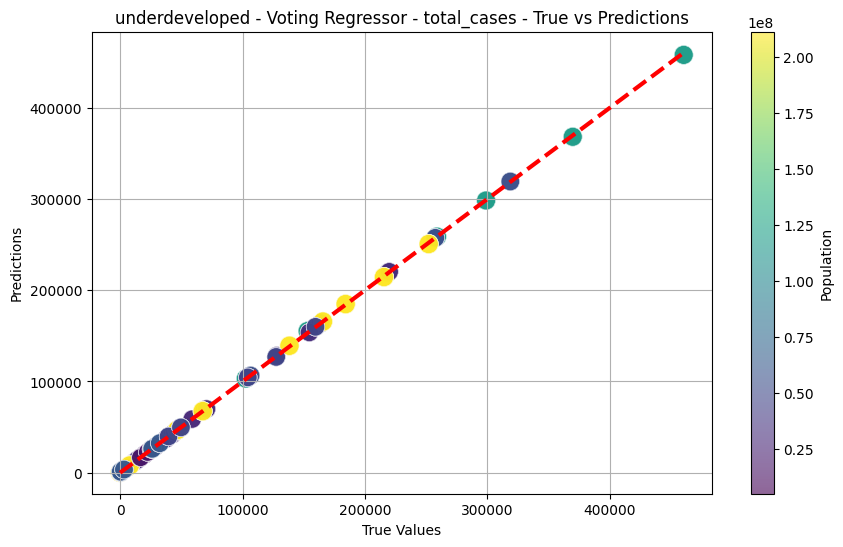

underdeveloped - Voting Regressor - total_deaths - MSE: 91.53191085099041, RMSE: 9.567231096351254, MAE: 5.537926889235067, R2: 0.9999657917343502


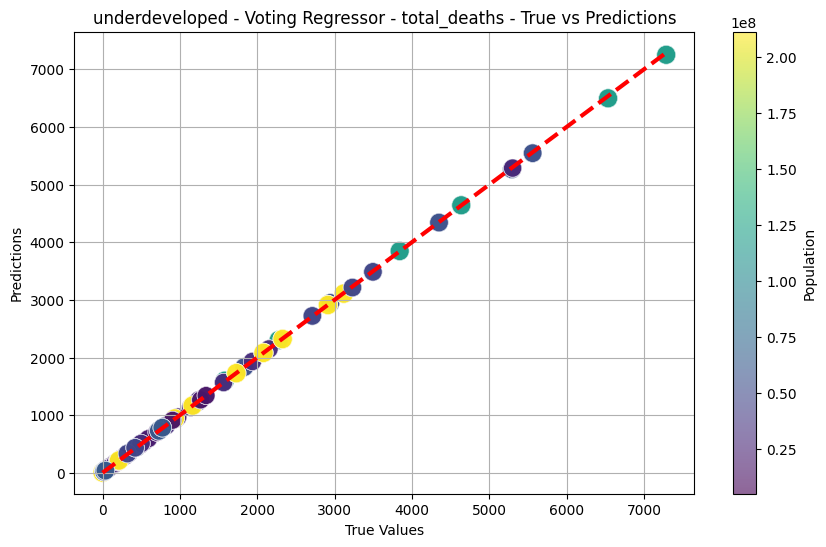

underdeveloped - Voting Regressor - All strains - All types of surveillance - MSE: 64.3762904959489, RMSE: 8.02348368827088, MAE: 3.1510838176272555, R2: 0.9998946810723034


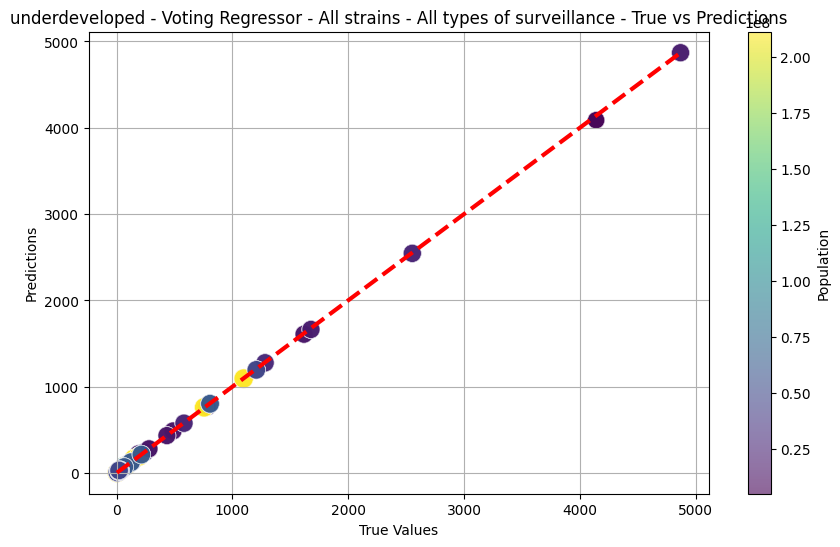

underdeveloped - Voting Regressor - Reported deaths caused by severe acute respiratory infections - MSE: 2.942617548554663, RMSE: 1.7154059427886632, MAE: 0.9050897377957797, R2: 0.9999278746291985


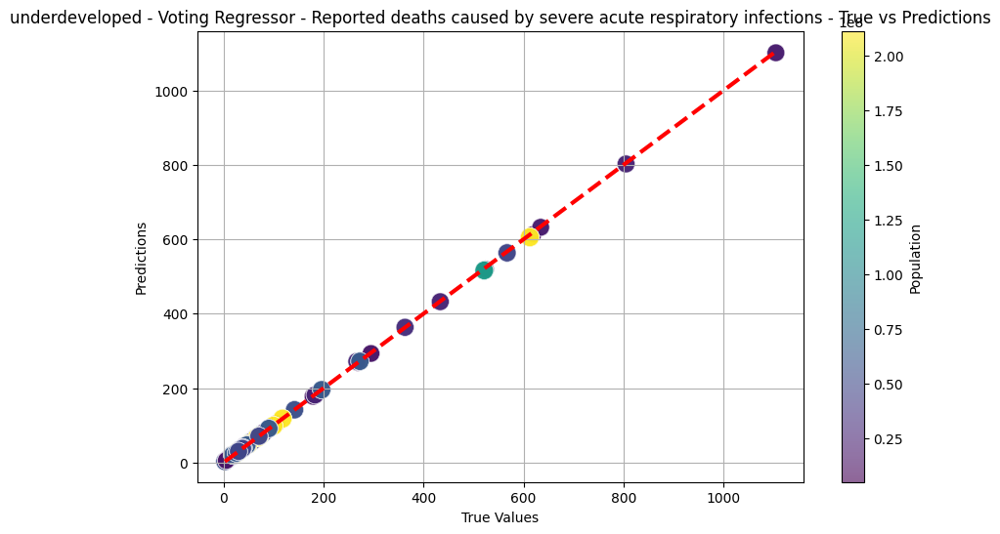

island - Voting Regressor - total_cases - MSE: 248970930.78061748, RMSE: 15778.812717711604, MAE: 3866.5480252197754, R2: 0.9994445921618959


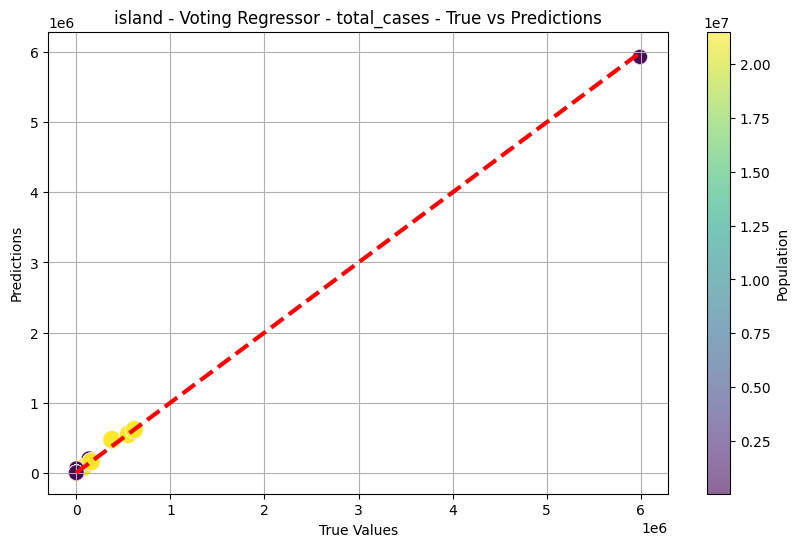

island - Voting Regressor - total_deaths - MSE: 72024.64671585438, RMSE: 268.37407981370774, MAE: 120.59399853285292, R2: 0.9999691541704362


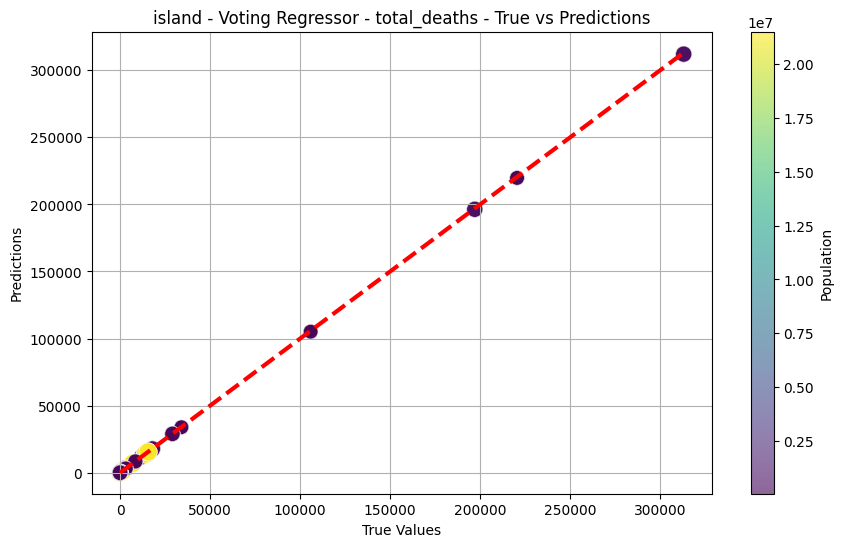

island - Voting Regressor - All strains - All types of surveillance - MSE: 24.941070040824663, RMSE: 4.994103527243369, MAE: 2.7058623360120593, R2: 0.9999327267253397


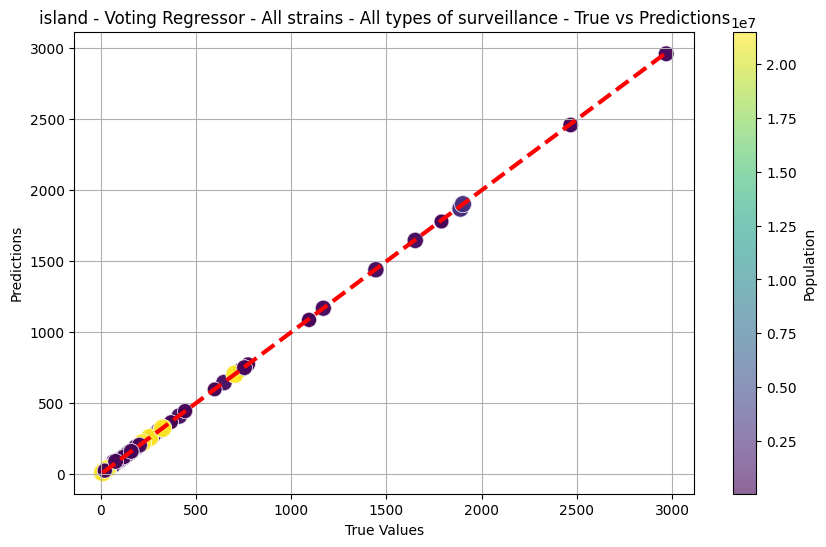

island - Voting Regressor - Reported deaths caused by severe acute respiratory infections - MSE: 4.885201004689867, RMSE: 2.210249082047059, MAE: 1.2260311812437419, R2: 0.9998970933223138


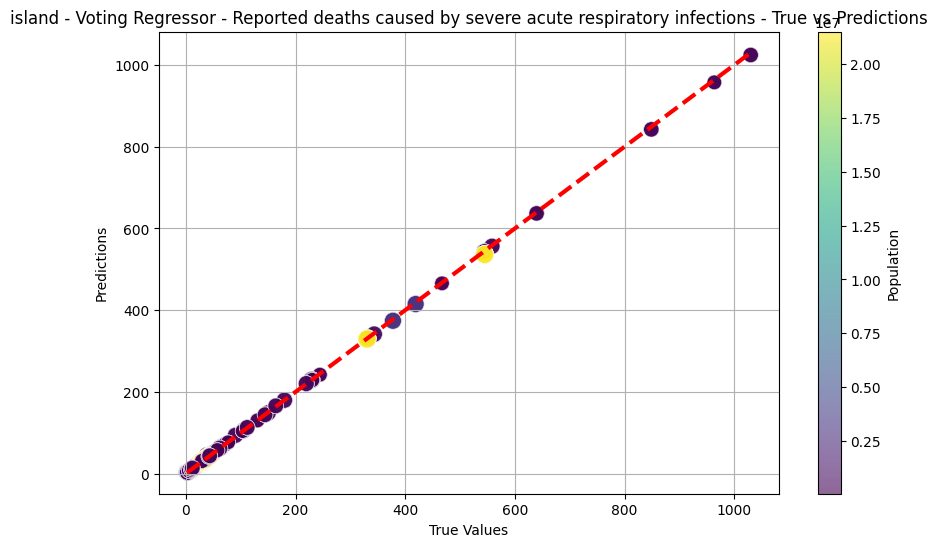

In [22]:
#VOTING REGRESSION
import pandas as pd
import numpy as np
from sklearn.ensemble import VotingRegressor, RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt

# Function to impute missing values by sampling from existing values in the same column
def impute_by_sampling(data):
    for column in data.columns:
        if data[column].isnull().sum() > 0:  # If there are missing values in the column
            # Sample with replacement from the non-missing values in the column
            data[column] = data[column].apply(lambda x: np.random.choice(data[column].dropna()) if pd.isnull(x) else x)
    return data

# Impute missing values in your data
project_merged_data_imputed = impute_by_sampling(project_merged_data)

# Function to evaluate model performance
def evaluate_model(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mse, rmse, mae, r2

# Function to plot predictions with color bar
def plot_predictions(y_true, y_pred, populations, title):
    plt.figure(figsize=(10, 6))
    sc = plt.scatter(y_true, y_pred, c=populations, cmap='viridis', s=np.log1p(populations) * 10,
                     alpha=0.6, edgecolors='w', linewidth=0.5)
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=3)
    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.title(title)
    plt.grid(True)
    cbar = plt.colorbar(sc)
    cbar.set_label('Population')
    plt.show()

# Function to preprocess data
def preprocess_data(data):
    # One-hot encode categorical variables if any
    data = pd.get_dummies(data, drop_first=True)
    return data

# Function to train and evaluate Voting Regressor
def train_evaluate_voting(data, category, target):
    X = data[features]
    y = data[target]
    populations = data['population']  # Population data

    # Ensure the target is numeric, handling errors
    y = pd.to_numeric(y, errors='coerce')

    # Handle missing or non-numeric values in the target variable
    if y.isnull().sum() > 0:
        print(f"Warning: Missing or non-numeric data in target for {category} - {target}. Filling with 0.")
        y = y.fillna(0)

    # Define the base models
    model1 = DecisionTreeRegressor(random_state=42)
    model2 = RandomForestRegressor(n_estimators=100, random_state=42)
    model3 = XGBRegressor(random_state=42, objective='reg:squarederror')

    # Create the Voting Regressor
    voting_model = VotingRegressor(estimators=[
        ('dt', model1),
        ('rf', model2),
        ('xgb', model3)
    ])

    voting_model.fit(X, y)
    y_pred = voting_model.predict(X)
    mse, rmse, mae, r2 = evaluate_model(y, y_pred)
    print(f'{category} - Voting Regressor - {target} - MSE: {mse}, RMSE: {rmse}, MAE: {mae}, R2: {r2}')
    plot_predictions(y, y_pred, populations, f"{category} - Voting Regressor - {target} - True vs Predictions")
    return voting_model

# Define the target variables
target_variables = ['total_cases', 'total_deaths', 'All strains - All types of surveillance', 'Reported deaths caused by severe acute respiratory infections']

# Define the feature variables (independent variables)
features = [col for col in project_merged_data_imputed.columns if col not in target_variables + ['date', 'location', 'population']]

# Define country lists for each category
country_categories = {
    "developed": ['Bahrain', 'Finland', 'France', 'Germany', 'Japan', 'Ireland', 'Italy', 'Netherlands', 'Singapore', 'Switzerland', 'United Kingdom', 'United States'],
    "developing": ['China', 'India', 'Peru', 'Philippines', 'Brazil', 'Bangladesh', 'Angola', 'Haiti', 'Indonesia', 'Afghanistan'],
    "underdeveloped": ['Nigeria', 'Chad', 'Ethiopia', 'Mali', 'Madagascar', 'Niger', 'Mozambique', 'Kenya', 'Tanzania', 'Somalia', 'Uganda', 'Central African Republic'],
    "island": ['Marshall Islands', 'St. Vincent and the Grenadines', 'Jamaica', 'Tonga', 'Kiribati', 'Dominica', 'Samoa', 'Fiji', 'Vanuatu', 'Solomon Islands', 'Maldives', 'Malta', 'Sri Lanka']
}

# Filter and preprocess data
def filter_and_preprocess_data(data, country_list):
    filtered_data = data[data['location'].isin(country_list)]
    filtered_data = filtered_data.drop(columns=['location'])
    filtered_data = preprocess_data(filtered_data)
    return filtered_data

# Apply the Voting Regressor model to each category and target
for category, country_list in country_categories.items():
    filtered_data = filter_and_preprocess_data(project_merged_data_imputed, country_list)
    for target in target_variables:
        model = train_evaluate_voting(filtered_data, category, target)



Fitting 5 folds for each of 72 candidates, totalling 360 fits
developed - total_cases - Validation MSE: 60061182129.54, RMSE: 245073.83, MAE: 33664.41, R2: 0.9955
developed - total_cases - Test MSE: 180183546385.05, RMSE: 424480.33, MAE: 100991.33, R2: 0.9513


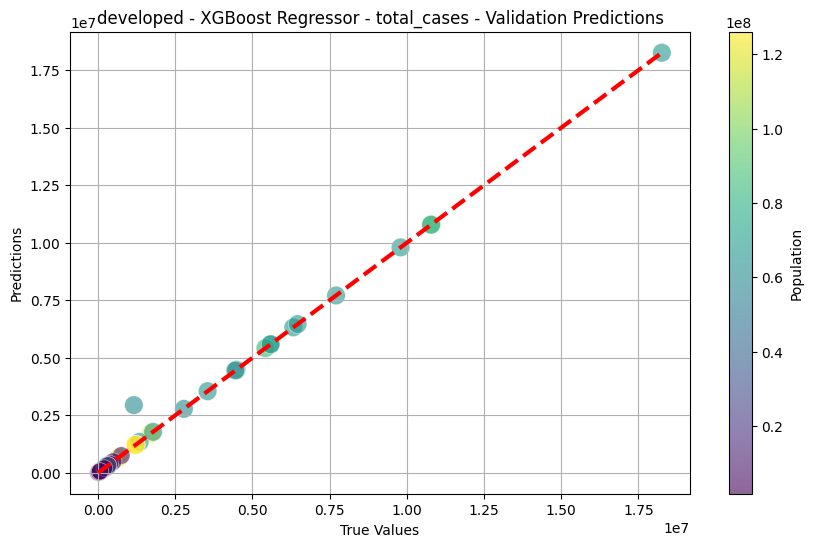

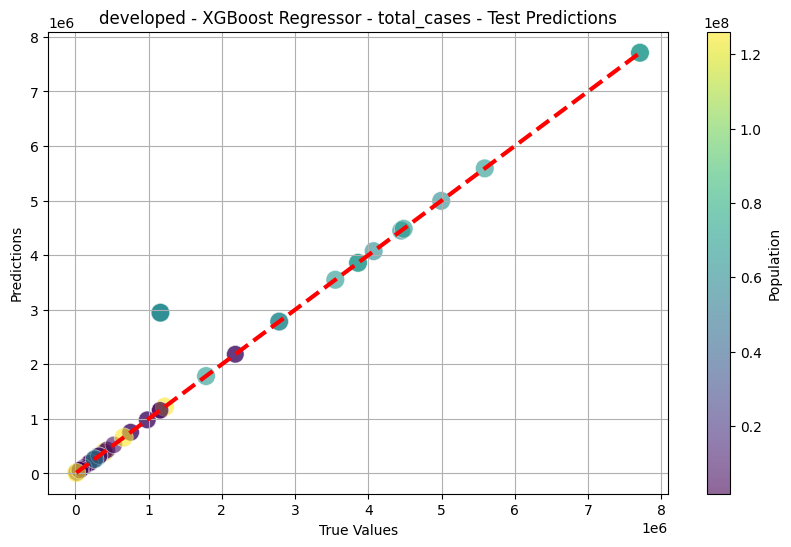

Fitting 5 folds for each of 72 candidates, totalling 360 fits
developed - total_deaths - Validation MSE: 11805386.41, RMSE: 3435.90, MAE: 471.97, R2: 0.9950
developed - total_deaths - Test MSE: 35416159.24, RMSE: 5951.15, MAE: 1415.89, R2: 0.9824


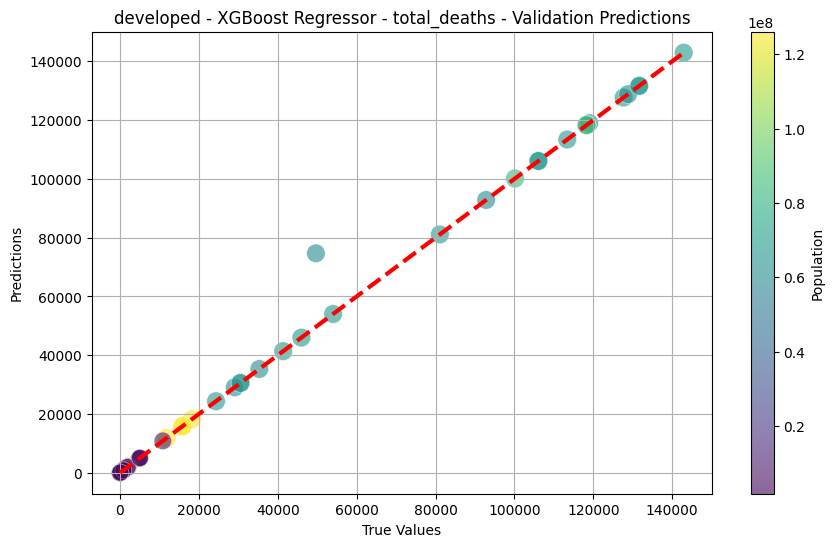

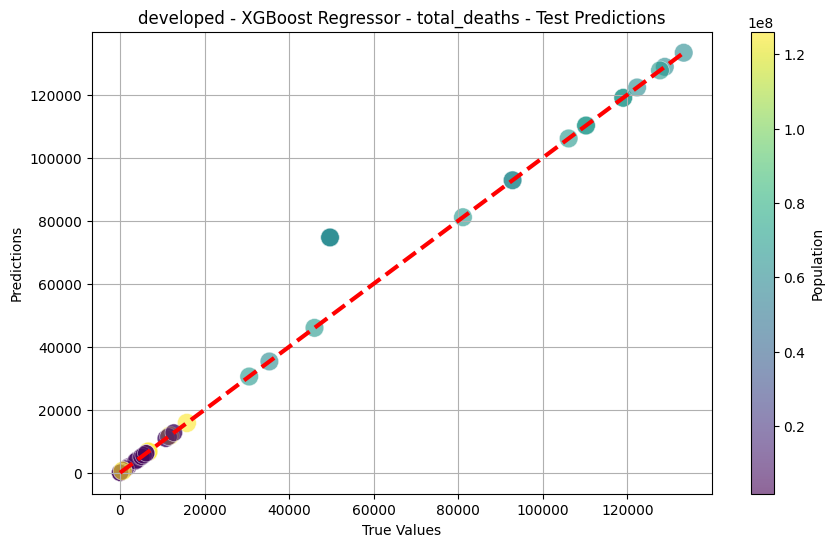

Fitting 5 folds for each of 72 candidates, totalling 360 fits
developed - All strains - All types of surveillance - Validation MSE: 3290.94, RMSE: 57.37, MAE: 7.97, R2: 0.9860
developed - All strains - All types of surveillance - Test MSE: 9872.80, RMSE: 99.36, MAE: 23.75, R2: 0.9844


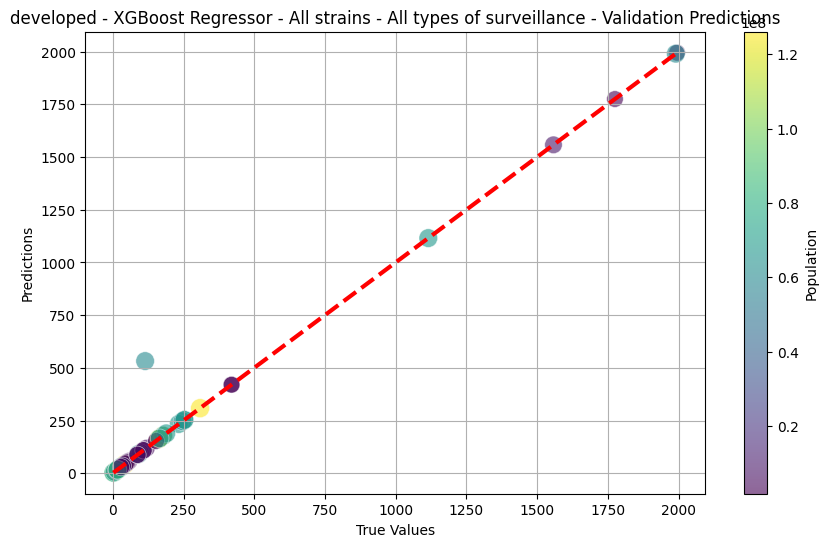

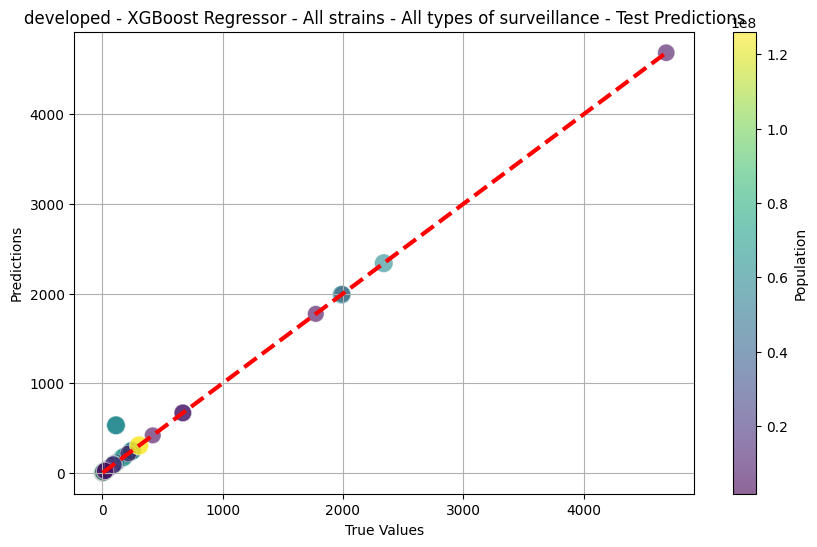

Fitting 5 folds for each of 72 candidates, totalling 360 fits
developed - Reported deaths caused by severe acute respiratory infections - Validation MSE: 0.80, RMSE: 0.89, MAE: 0.44, R2: 1.0000
developed - Reported deaths caused by severe acute respiratory infections - Test MSE: 2.11, RMSE: 1.45, MAE: 0.75, R2: 1.0000


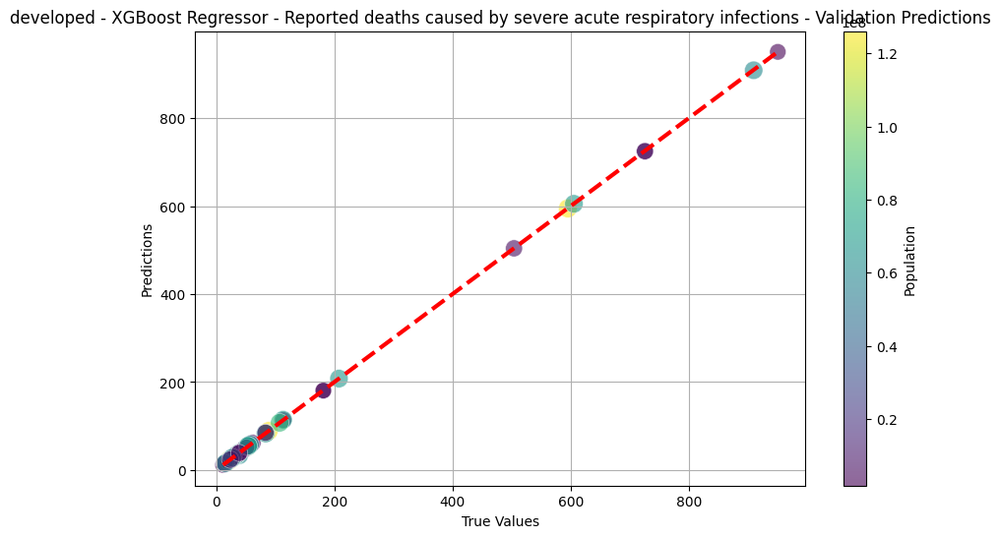

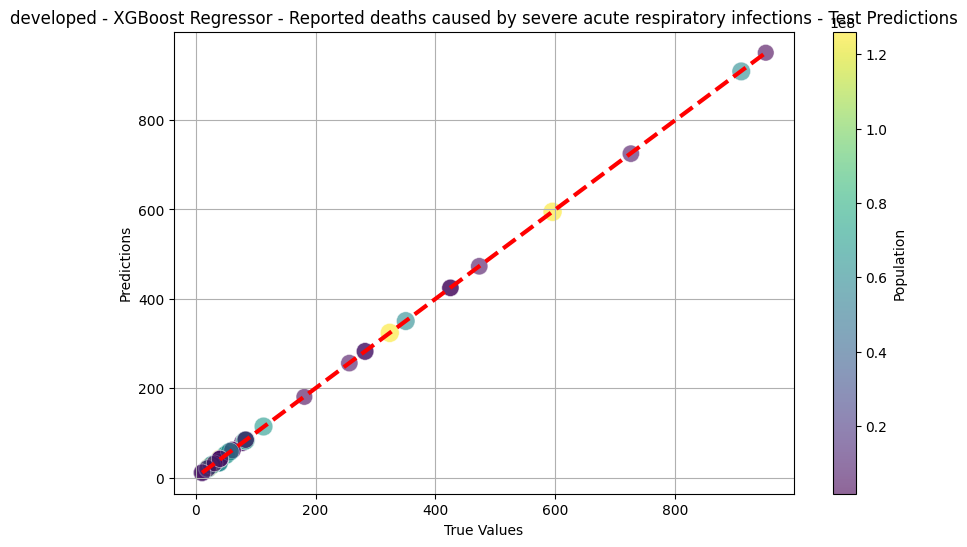

Fitting 5 folds for each of 72 candidates, totalling 360 fits
developing - total_cases - Validation MSE: 7098843126.92, RMSE: 84254.63, MAE: 17255.25, R2: 0.9999
developing - total_cases - Test MSE: 6980529078.15, RMSE: 83549.56, MAE: 16968.15, R2: 0.9999


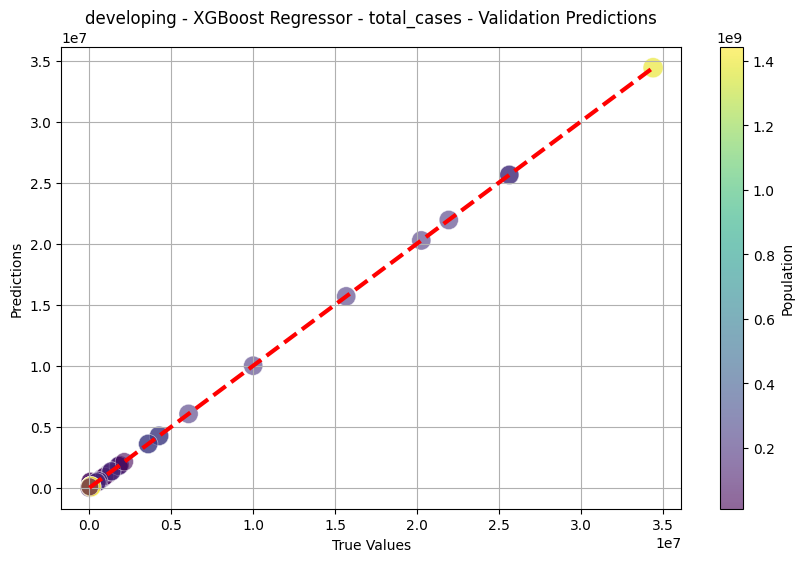

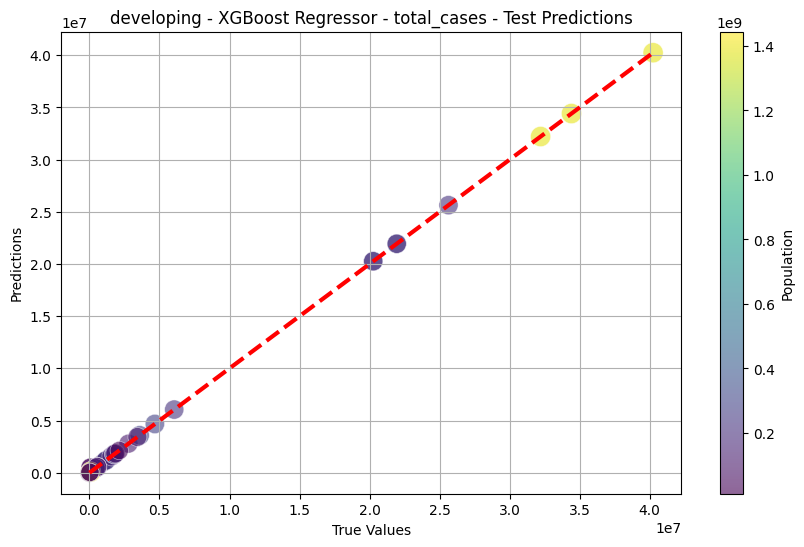

Fitting 5 folds for each of 72 candidates, totalling 360 fits
developing - total_deaths - Validation MSE: 2311222.96, RMSE: 1520.27, MAE: 1014.49, R2: 0.9999
developing - total_deaths - Test MSE: 2315721.90, RMSE: 1521.75, MAE: 959.41, R2: 0.9999


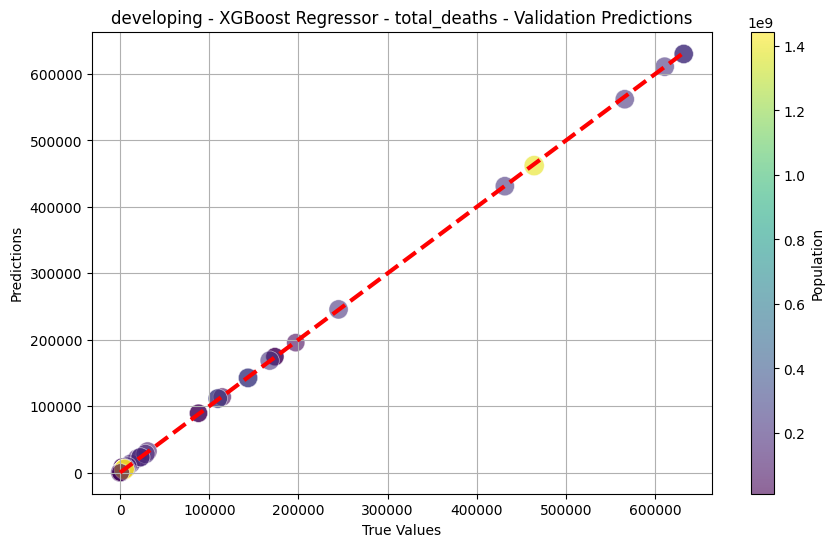

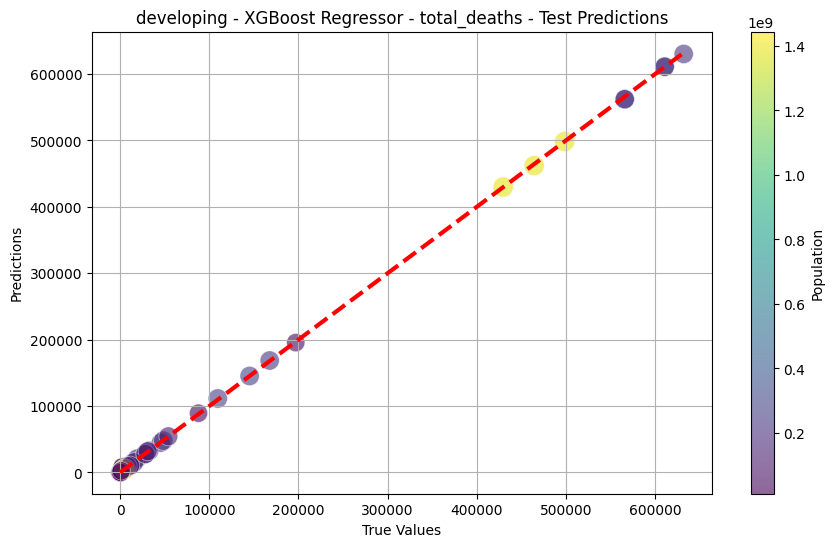

Fitting 5 folds for each of 72 candidates, totalling 360 fits
developing - All strains - All types of surveillance - Validation MSE: 12680.70, RMSE: 112.61, MAE: 29.25, R2: 0.9388
developing - All strains - All types of surveillance - Test MSE: 12469.36, RMSE: 111.67, MAE: 28.77, R2: 0.9481


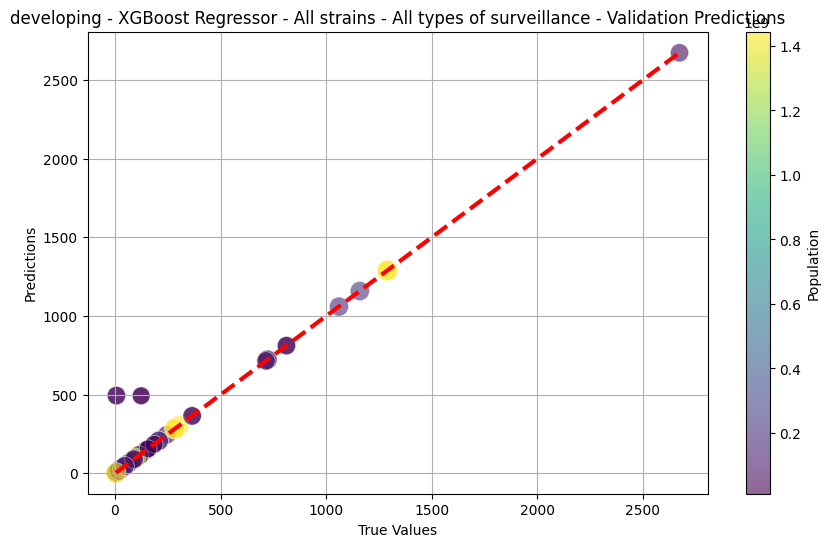

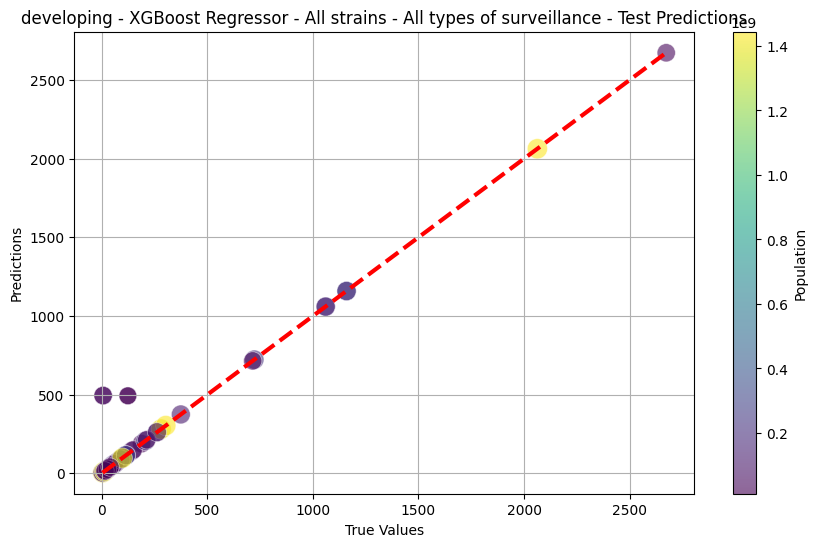

Fitting 5 folds for each of 72 candidates, totalling 360 fits
developing - Reported deaths caused by severe acute respiratory infections - Validation MSE: 149321.01, RMSE: 386.42, MAE: 71.28, R2: 0.1462
developing - Reported deaths caused by severe acute respiratory infections - Test MSE: 146832.33, RMSE: 383.19, MAE: 70.09, R2: 0.1000


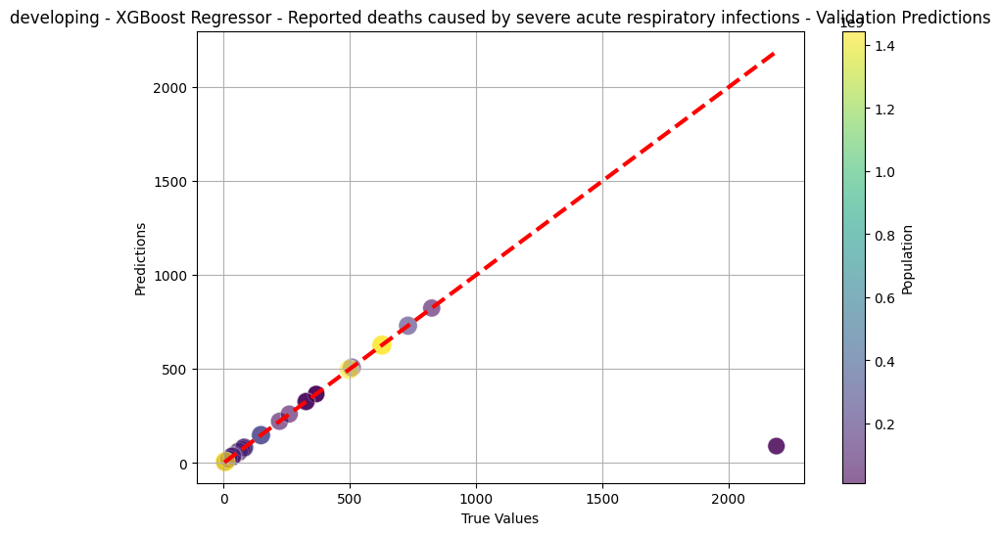

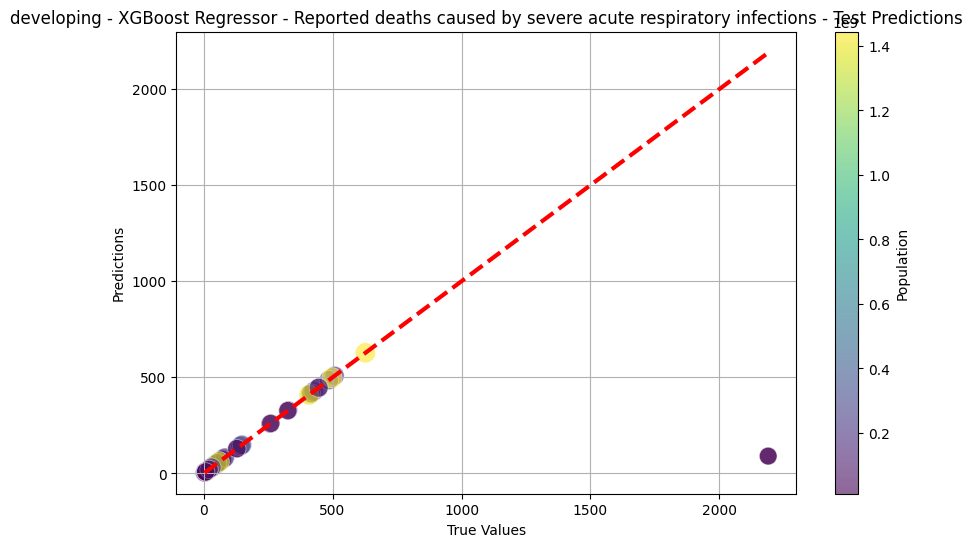

Fitting 5 folds for each of 72 candidates, totalling 360 fits
underdeveloped - total_cases - Validation MSE: 2434134873.72, RMSE: 49336.95, MAE: 15599.98, R2: 0.6896
underdeveloped - total_cases - Test MSE: 2742136435.56, RMSE: 52365.41, MAE: 16754.04, R2: 0.7646


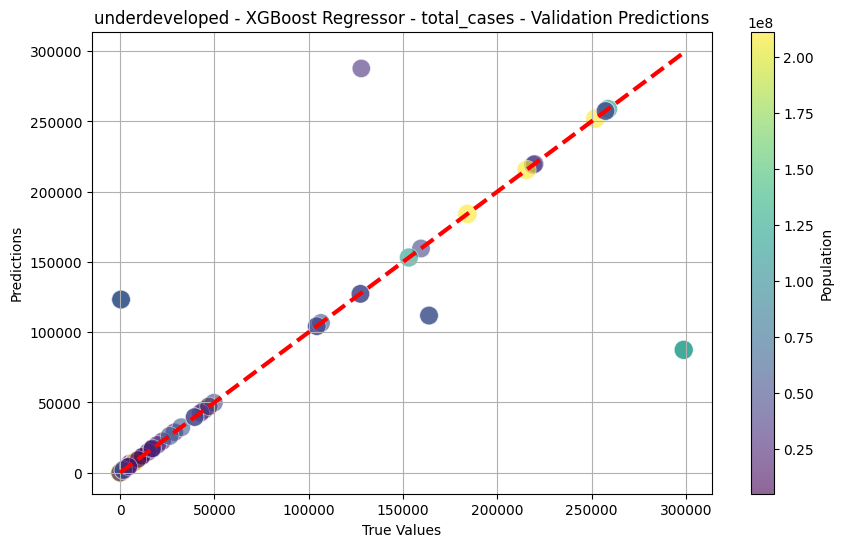

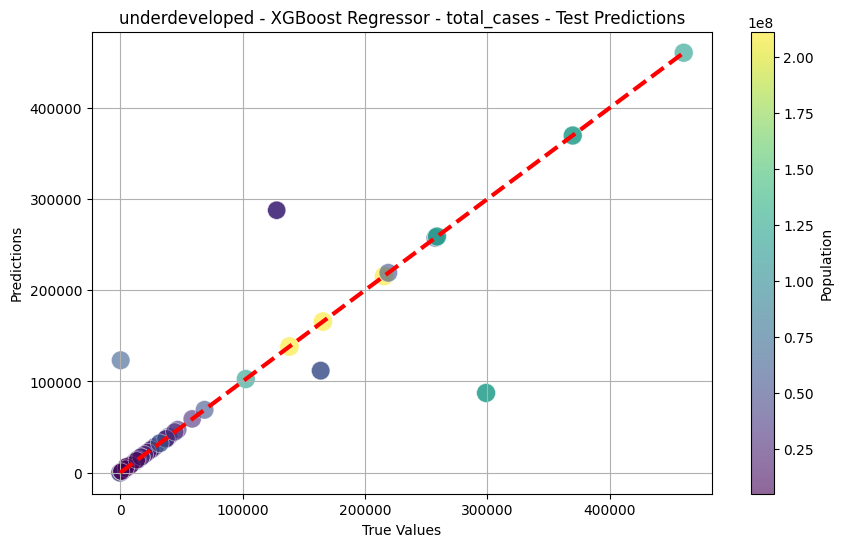

Fitting 5 folds for each of 72 candidates, totalling 360 fits
underdeveloped - total_deaths - Validation MSE: 310367.12, RMSE: 557.11, MAE: 183.96, R2: 0.8617
underdeveloped - total_deaths - Test MSE: 270165.01, RMSE: 519.77, MAE: 175.31, R2: 0.9243


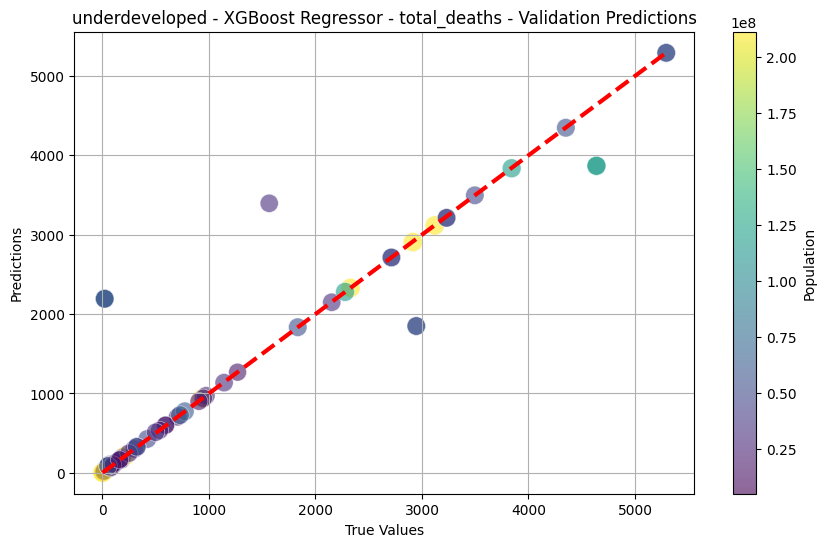

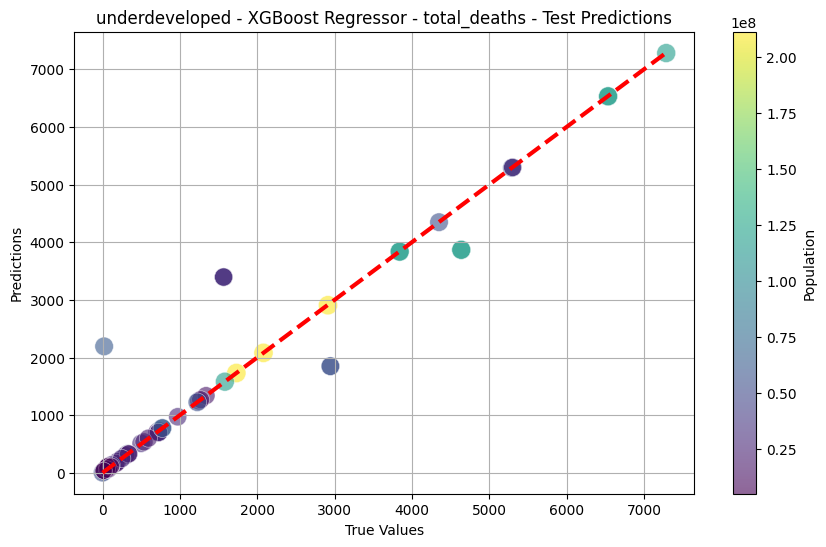

Fitting 5 folds for each of 72 candidates, totalling 360 fits
underdeveloped - All strains - All types of surveillance - Validation MSE: 9.87, RMSE: 3.14, MAE: 0.93, R2: 1.0000
underdeveloped - All strains - All types of surveillance - Test MSE: 19.21, RMSE: 4.38, MAE: 1.44, R2: 1.0000


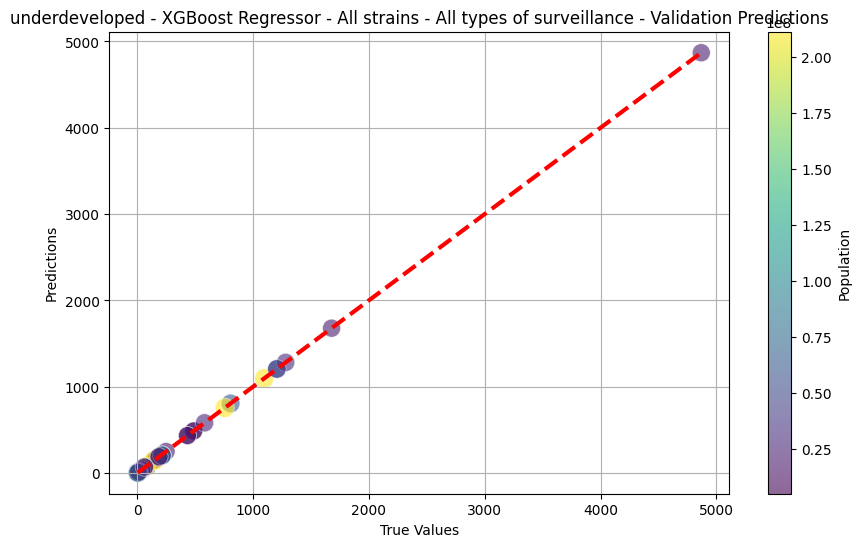

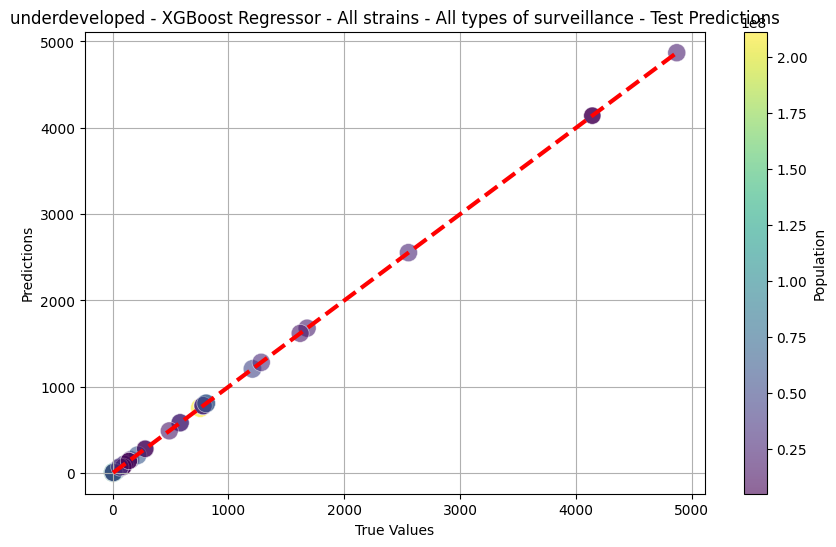

Fitting 5 folds for each of 72 candidates, totalling 360 fits
underdeveloped - Reported deaths caused by severe acute respiratory infections - Validation MSE: 17320.97, RMSE: 131.61, MAE: 35.78, R2: 0.7318
underdeveloped - Reported deaths caused by severe acute respiratory infections - Test MSE: 19191.02, RMSE: 138.53, MAE: 37.68, R2: 0.6280


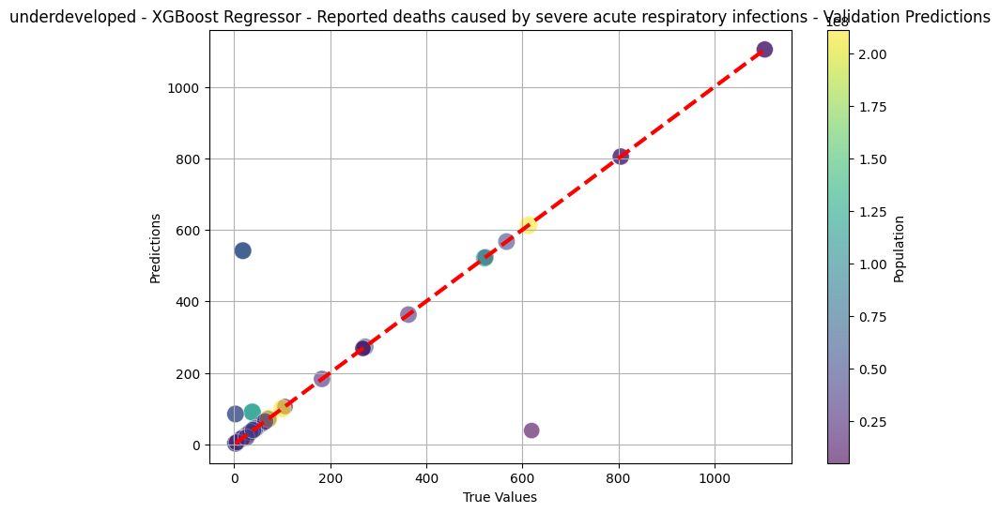

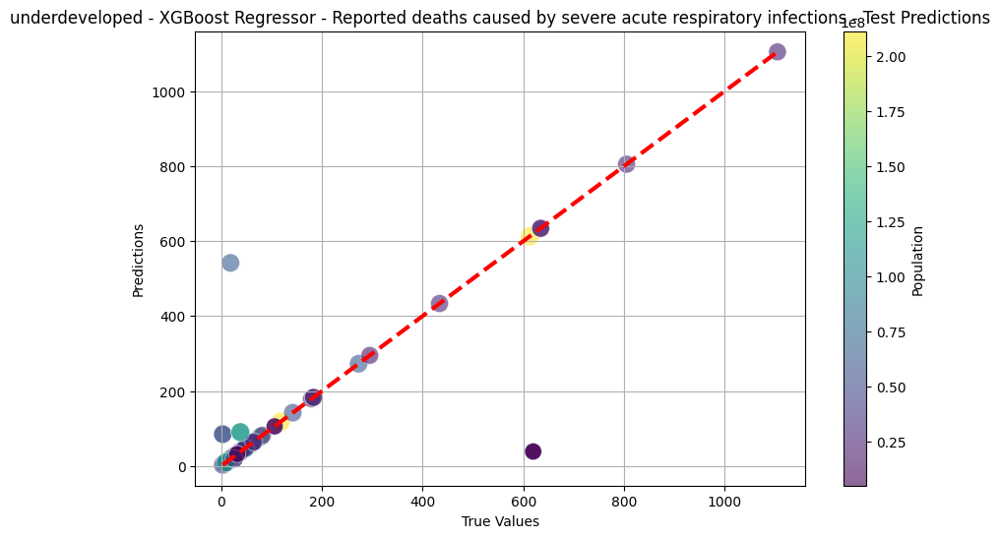

Fitting 5 folds for each of 72 candidates, totalling 360 fits
island - total_cases - Validation MSE: 52630884169.09, RMSE: 229414.22, MAE: 47549.12, R2: 0.9050
island - total_cases - Test MSE: 52044113027.15, RMSE: 228131.79, MAE: 42813.04, R2: 0.9056


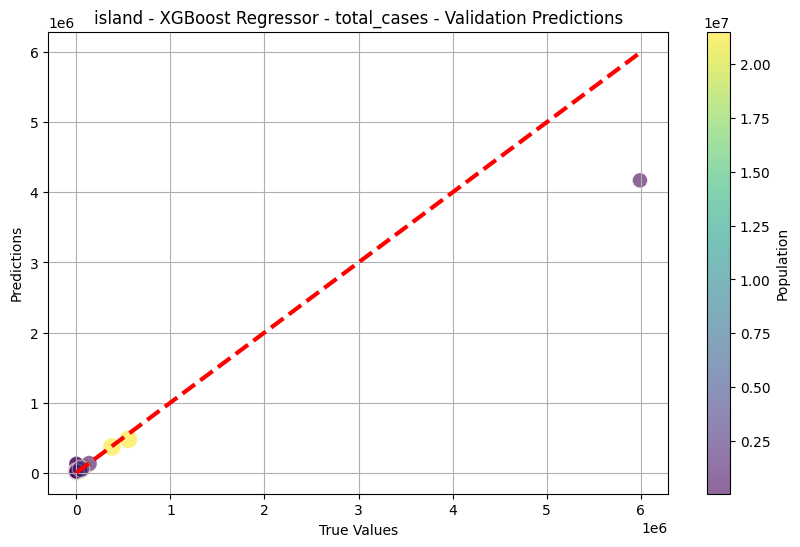

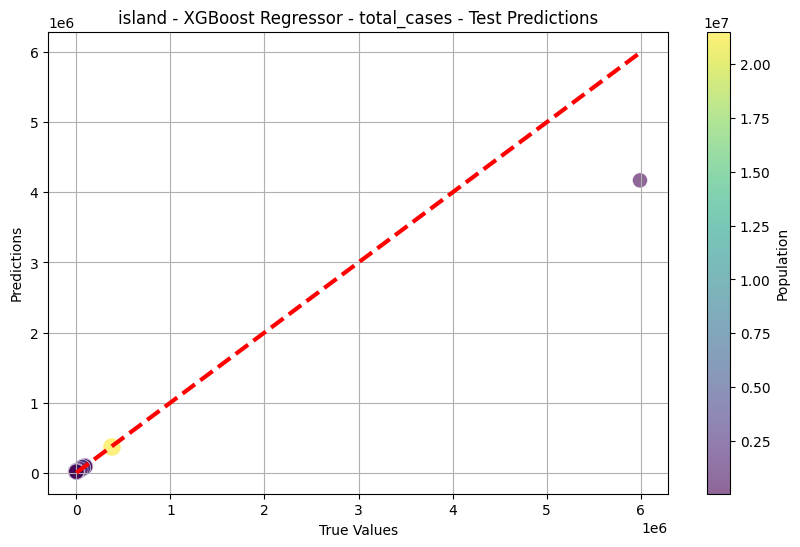

Fitting 5 folds for each of 72 candidates, totalling 360 fits
island - total_deaths - Validation MSE: 48298945.11, RMSE: 6949.74, MAE: 2048.09, R2: 0.9270
island - total_deaths - Test MSE: 760625.44, RMSE: 872.14, MAE: 124.42, R2: 0.9994


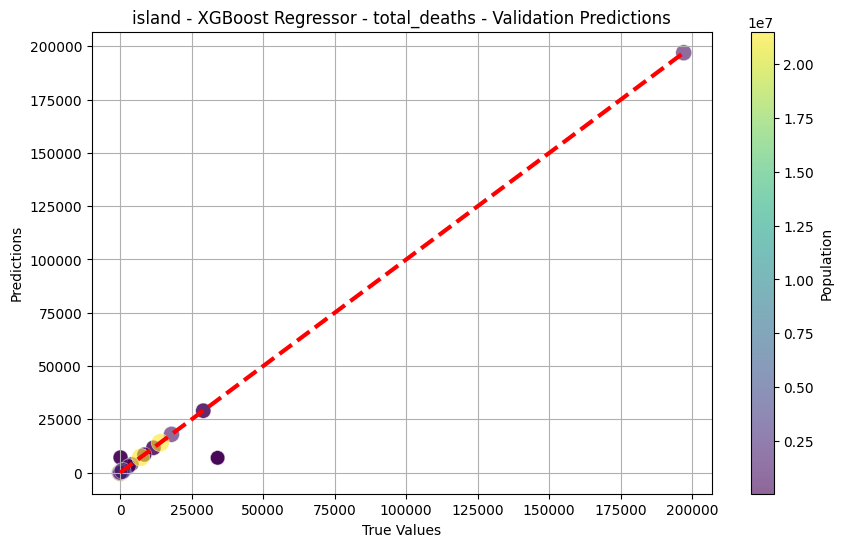

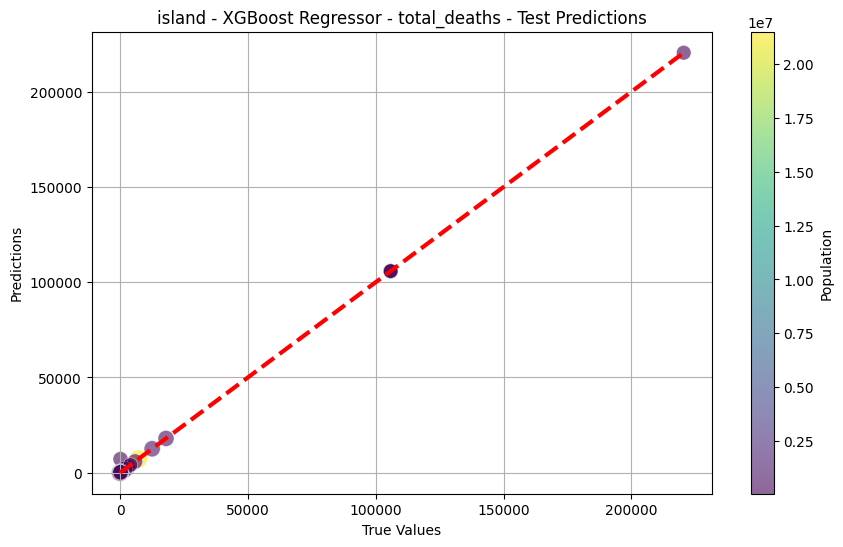

Fitting 5 folds for each of 72 candidates, totalling 360 fits
island - All strains - All types of surveillance - Validation MSE: 88823.78, RMSE: 298.03, MAE: 92.17, R2: 0.7162
island - All strains - All types of surveillance - Test MSE: 125255.61, RMSE: 353.91, MAE: 82.48, R2: 0.7382


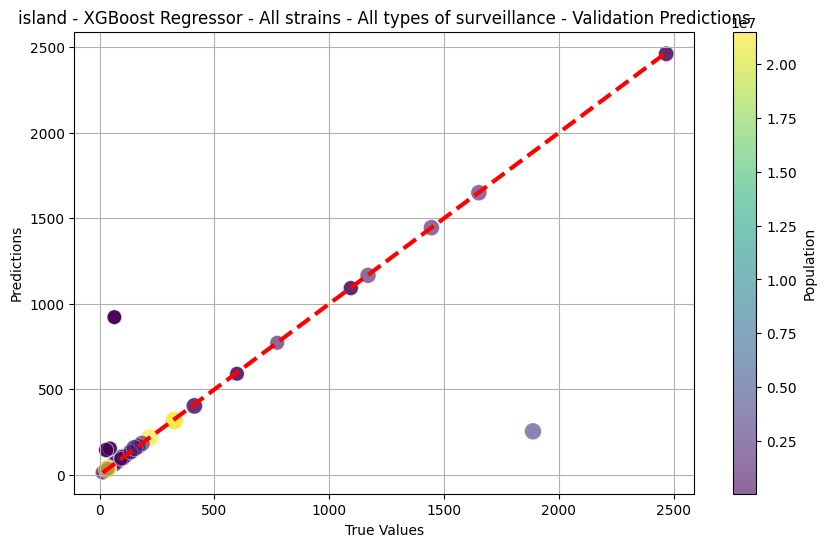

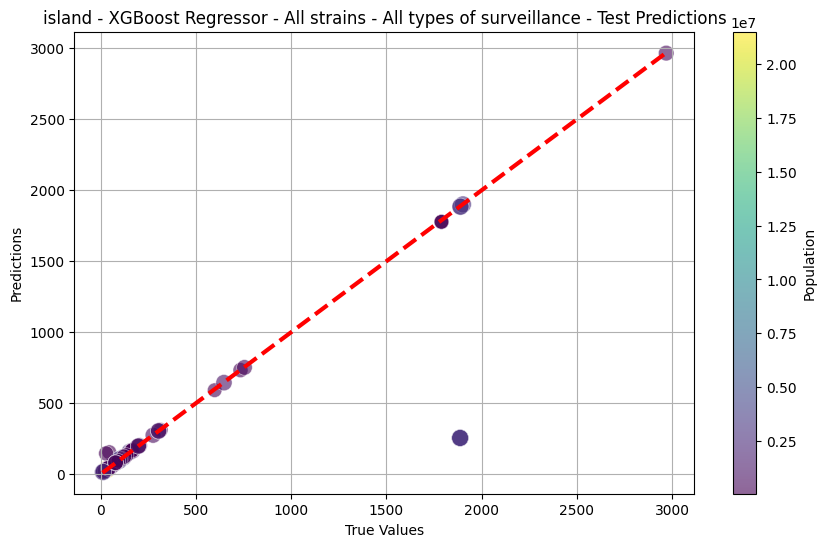

Fitting 5 folds for each of 72 candidates, totalling 360 fits
island - Reported deaths caused by severe acute respiratory infections - Validation MSE: 6485.75, RMSE: 80.53, MAE: 27.30, R2: 0.7966
island - Reported deaths caused by severe acute respiratory infections - Test MSE: 267.64, RMSE: 16.36, MAE: 3.49, R2: 0.9959


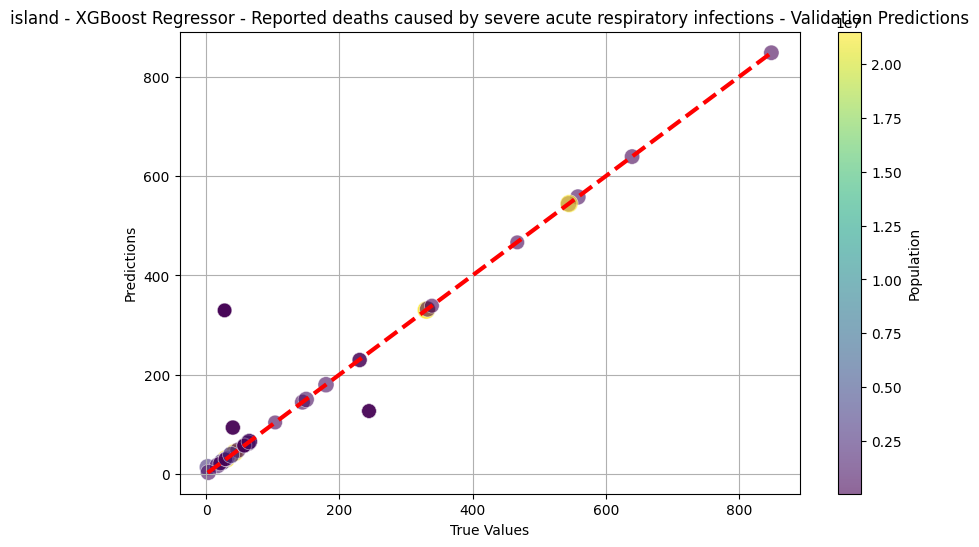

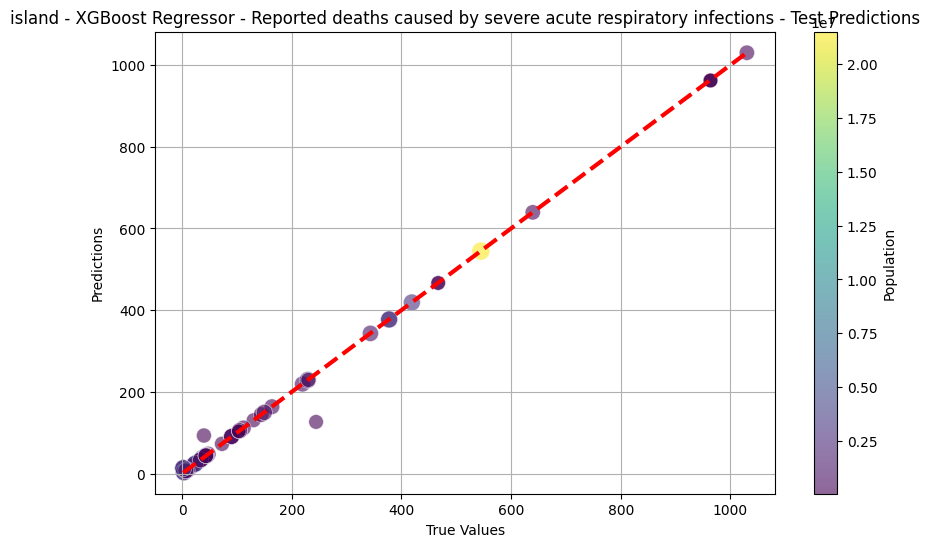

In [33]:
#XGBOOST
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.impute import KNNImputer
import matplotlib.pyplot as plt
import xgboost as xgb

# Load your merged data here
project_merged_data = pd.read_csv("/content/drive/MyDrive/FINAL PROJECT/Project_merged_data.csv")

# Country list dictionary
country_categories = {
    "developed": ['Bahrain', 'Finland', 'France', 'Germany', 'Japan', 'Ireland', 'Italy', 'Netherlands', 'Singapore', 'Switzerland', 'United Kingdom', 'United States'],
    "developing": ['China', 'India', 'Peru', 'Philippines', 'Brazil', 'Bangladesh', 'Angola', 'Haiti', 'Indonesia', 'Afghanistan'],
    "underdeveloped": ['Nigeria', 'Chad', 'Ethiopia', 'Mali', 'Madagascar', 'Niger', 'Mozambique', 'Kenya', 'Tanzania', 'Somalia', 'Uganda', 'Central African Republic'],
    "island": ['Marshall Islands', 'St. Vincent and the Grenadines', 'Jamaica', 'Tonga', 'Kiribati', 'Dominica', 'Samoa', 'Fiji', 'Vanuatu', 'Solomon Islands', 'Maldives', 'Malta', 'Sri Lanka']
}

# Define target variables for both COVID-19 and Influenza
target_variables = ['total_cases', 'total_deaths', 'All strains - All types of surveillance', 'Reported deaths caused by severe acute respiratory infections']

# Define feature variables (excluding date, location, and population)
features = [col for col in project_merged_data.columns if col not in target_variables + ['date', 'location', 'population']]

# KNN Imputation function
def impute_missing_values(X):
    """Impute missing values using KNN imputer."""
    imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')
    X_imputed = imputer.fit_transform(X)
    X_imputed = pd.DataFrame(X_imputed, columns=X.columns)
    return X_imputed

# Preprocess the data
def preprocess_data(data):
    # One-hot encode categorical variables if any
    data = pd.get_dummies(data, drop_first=True)
    # Impute missing values using KNN
    data = impute_missing_values(data)
    return data

# Train and evaluate XGBoost with GridSearchCV
def train_evaluate_xgboost(data, category, target):
    X = data[features]
    y = data[target]
    populations = data['population']  # Population data

    # Ensure the target is numeric, handling errors
    y = pd.to_numeric(y, errors='coerce')

    # Handle missing or non-numeric values in the target variable
    if y.isnull().sum() > 0:
        print(f"Warning: Missing or non-numeric data in target for {category} - {target}. Filling with 0.")
        y = y.fillna(0)  # Optionally, use a different strategy, like y.fillna(y.mean())

    # Split data into training, validation, and test sets
    X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

    # Subset the populations for validation and test sets
    populations_val = populations.loc[X_val.index]
    populations_test = populations.loc[X_test.index]

    # Define the XGBoost model
    model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

    # Set up the parameter grid for hyperparameter tuning
    param_grid = {
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7, 10],
        'n_estimators': [100, 200, 500],
        'subsample': [0.8, 1.0]
    }

    # Use GridSearchCV for hyperparameter tuning
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)
    grid_search.fit(X_train, y_train)

    # Best model from GridSearchCV
    best_model = grid_search.best_estimator_

    # Validate the model
    y_val_pred = best_model.predict(X_val)
    val_mse, val_rmse, val_mae, val_r2 = evaluate_model(y_val, y_val_pred)
    print(f'{category} - {target} - Validation MSE: {val_mse:.2f}, RMSE: {val_rmse:.2f}, MAE: {val_mae:.2f}, R2: {val_r2:.4f}')

    # Test the model
    y_test_pred = best_model.predict(X_test)
    test_mse, test_rmse, test_mae, test_r2 = evaluate_model(y_test, y_test_pred)
    print(f'{category} - {target} - Test MSE: {test_mse:.2f}, RMSE: {test_rmse:.2f}, MAE: {test_mae:.2f}, R2: {test_r2:.4f}')

    # Plot predictions
    plot_predictions(y_val, y_val_pred, populations_val, f"{category} - XGBoost Regressor - {target} - Validation Predictions")
    plot_predictions(y_test, y_test_pred, populations_test, f"{category} - XGBoost Regressor - {target} - Test Predictions")

    return best_model

def evaluate_model(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mse, rmse, mae, r2

def plot_predictions(y_true, y_pred, populations, title):
    plt.figure(figsize=(10, 6))

    # Adjust point size
    sc = plt.scatter(y_true, y_pred, c=populations, cmap='viridis', s=np.log1p(populations) * 10,
                     alpha=0.6, edgecolors='w', linewidth=0.5)

    # Plotting the diagonal line
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=3)

    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.title(title)
    plt.grid(True)

    # Add color bar (keeping population reference)
    cbar = plt.colorbar(sc)
    cbar.set_label('Population')

    plt.show()

# Train and evaluate for each category and target
for category, country_list in country_categories.items():
    filtered_data = project_merged_data[project_merged_data['location'].isin(country_list)]
    filtered_data = filtered_data.drop(columns=['location'])
    filtered_data = preprocess_data(filtered_data)
    for target in target_variables:
        model = train_evaluate_xgboost(filtered_data, category, target)
